In [1]:
import sys
sys.path.append('../Modules')
import numpy as np
import pandas as pd

import galsim
from coord import radians

import Image_Fits_Stats
#import Visual_analysis

from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import LogNorm
import pywt
from scipy.stats import norm
import math

#Galsim arguments
target_size=64
galaxy_type='real'
psf_type='real'

test_galaxies_indices=[518, 33671, 25576, 45805, 31577, 41707, 19844, 13628,  8624]

cat = galsim.COSMOSCatalog(sample='23.5')
#Pixel scale in arcsec (the same for all the galaxies)
_,_,_,pixel_scale,_=cat.getRealParams(0)

# Functions

## Obtain GSObject

In [2]:
#Obtain galsim.GSObject for a given galaxy 
#with noise,ellipticity and rotation angle
def get_COSMOS_galaxy(index):
    #Making galaxy
    gal=cat.makeGalaxy(index,gal_type=galaxy_type)
    
    #Get the PSF object
    psf = gal.original_psf
    #Perform convolution with PSF to get the original HST image
    gal=galsim.Convolve(gal, psf)
    
    return gal

def rotate_galaxy(gal,angle):
        
    # gal.rotate turns anticlockwise, therefore we need to pass -angle
    rotation_angle=galsim.Angle(-angle*radians)
    
    rotated_gal=gal.rotate(rotation_angle)
    
    return rotated_gal

## Downscaling

In [3]:
#Our goal is to transform the galaxy such that galaxy_size->target_size
#However, we only use downscaling, so if initial galaxy_size<target_size
#we leave the image as it is
def get_downscale_factor(image_size,galaxy_size,target_size):
    
    if target_size<galaxy_size:
        #We want to downscale image,so galaxy_size->target_size
        
        #The scale may seem strange but Galsim usually works in terms Galsim_size=Image_size-2
        Galsim_scale=pixel_scale*(galaxy_size-2)/(target_size-2)
        Scaling_factor=target_size/galaxy_size
        
        return Galsim_scale,Scaling_factor
    
    
    elif target_size<=image_size:
        #Here image_size≥target_size≥galaxy_size
        #We don't want to upscale anything which is needed for  
        #It literally means that no downscaling is needed
        #hence return the original values
        
        return pixel_scale,1
    
    else:
        #The original image is smaller than the desired one.
        #We don't want to upscale anything or use padding
        #So this galaxy doesn't suit our needs
        
        return False,False

## Estimate noise

In [20]:
#Using elliptical representation of galaxy extract galaxy-free regions
#That we can use for noise estimation
def get_Background_image(image,R_cut,Ellipticity,Angle):
    
    (y_size,x_size)=image.shape
    R_cut=np.minimum(R_cut,np.minimum(y_size,x_size)//2)
    
    #oblique parallelepiped inscribed in a vertical parallelepiped
    galaxy_x_size=R_cut*np.cos(Angle)+Ellipticity*R_cut*np.abs(np.sin(Angle))
    galaxy_y_size=R_cut*np.abs(np.sin(Angle))+Ellipticity*R_cut*np.cos(Angle)
    
    #Offsets from image borders that cover noise regions
    Bkg_x_offset=np.floor(x_size//2-galaxy_x_size).astype(int)
    Bkg_y_offset=np.floor(y_size//2-galaxy_y_size).astype(int)

    #Understand whether we should use horizontally aligned background
    #Or vertically aligned
    Horizontal_lines_area=2*Bkg_y_offset*x_size
    Vertical_lines_area=2*Bkg_x_offset*y_size

    if Vertical_lines_area>Horizontal_lines_area:
        Bkg_image=np.zeros((y_size,2*Bkg_x_offset))
        
        #Left line
        Bkg_image[:,:Bkg_x_offset]=image[:,:Bkg_x_offset]
        #Right line
        Bkg_image[:,-Bkg_x_offset:]=image[:,-Bkg_x_offset:]
    
    
    elif Horizontal_lines_area!=0:
        Bkg_image=np.zeros((2*Bkg_y_offset,x_size))
        
        #Upper line
        Bkg_image[:Bkg_y_offset,:]=image[:Bkg_y_offset,:]
        #Lower line
        Bkg_image[-Bkg_y_offset:,:]=image[-Bkg_y_offset:,:]
        
        
    else:
        return False,0
    
    return True,Bkg_image

'''
skimage.restoration.estimate_sigma
[1] D. L. Donoho and I. M. Johnstone. "Ideal spatial adaptation 
by wavelet shrinkage." Biometrika 81.3 (1994): 425-455.
       :DOI:`10.1093/biomet/81.3.425`
'''
def estimate_sigma(Background_image):
    
    coeffs = pywt.dwtn(Background_image, wavelet='db2')
    detail_coeffs = coeffs['d' * Background_image.ndim]

    # Consider regions with detail coefficients exactly zero to be masked out
    detail_coeffs = detail_coeffs[np.nonzero(detail_coeffs)]

    # 75th quantile of the underlying, symmetric noise distribution
    denom = norm.ppf(0.75)
    return np.median(np.abs(detail_coeffs)) / denom

# Create galaxy

In [14]:
def create_Parametric_description(index):
    
    #Create description of galaxy features
    parameters=pd.Series(cat.getParametricRecord(index))[['IDENT', 'mag_auto',  'zphot']]

    #Extract Galaxy fits, namely Sersic and Double Sersic (bulge+disk)
    parameters['COSMOS_use_bulgefit']= cat.getParametricRecord(index)['use_bulgefit']
    
    #Drop Boxiness from Sersic
    COSMOS_Sersic=np.delete(pd.Series(cat.getParametricRecord(index))['sersicfit'],4)
    COSMOS_Sersic=pd.Series(data=COSMOS_Sersic,index=['COSMOS_Sersic_I','COSMOS_Sersic_HLR','COSMOS_Sersic_n','COSMOS_Sersic_q',
                                                      'COSMOS_Sersic_x0','COSMOS_Sersic_y0','COSMOS_Sersic_phi'])

    #Drop Boxiness from Bulge and Disk
    COSMOS_Bulge_Disk=np.delete(pd.Series(cat.getParametricRecord(index))['bulgefit'],[4,12])
    COSMOS_Disk=pd.Series(data=COSMOS_Bulge_Disk[:7],
                            index=['COSMOS_Disk_I','COSMOS_Disk_HLR','COSMOS_Disk_n','COSMOS_Disk_q',
                'COSMOS_Disk_x0','COSMOS_Disk_y0','COSMOS_Disk_phi'])
    COSMOS_Bulge=pd.Series(data=COSMOS_Bulge_Disk[7:],
                            index=['COSMOS_Bulge_I','COSMOS_Bulge_HLR','COSMOS_Bulge_n','COSMOS_Bulge_q',
                'COSMOS_Bulge_x0','COSMOS_Bulge_y0','COSMOS_Bulge_phi'])
    
    #Get Galaxy's noise
    _,_,_,_,COSMOS_noise_variance=cat.getRealParams(index)
    parameters['COSMOS_noise']=np.sqrt(COSMOS_noise_variance)
    
    parameters=parameters.append(COSMOS_Sersic)
    parameters=parameters.append(COSMOS_Bulge)
    parameters=parameters.append(COSMOS_Disk)
    
    return parameters

def create_Galaxy(index,Radial_profile_threshold=0.05):
    
    parameters=create_Parametric_description(index)
    
    #Get GSObject and noise
    gal=get_COSMOS_galaxy(index)
    original_image=gal.drawImage(use_true_center=True, method='auto').array
    
    try:
        #Extracting the parameters to build elliptical coordinates
        Sersic_fit,_=Image_Fits_Stats.fit_image(original_image,noise_std=parameters['COSMOS_noise'],exposure_time=2028)
        Ellipticity,x0,y0,Angle=Sersic_fit[-4:]
        Radial_profile=Image_Fits_Stats.Radial_profile(original_image,Ellipticity,x0,y0,Angle)

        #Getting border of galaxy from radial profile
        Radial_profile[-1]=np.nan_to_num(Radial_profile[-1])
        Radial_profile=Radial_profile-Radial_profile[-1]
        Radial_profile/=np.nanmax(Radial_profile)
        R_cut=np.where((Radial_profile<Radial_profile_threshold))[0][0]
    except:
        print('Unsuccesfull original image processing')
        return False
    
    parameters['Original_R_cut']=R_cut
    
    #Our target is to bring 2*R_cut->target_size, which is 64
    Galsim_scale,Scaling_factor=get_downscale_factor(original_image.shape[1],2*R_cut,target_size)
    
    #If original image is smaller than the desired one
    if np.logical_not(Galsim_scale):
        return False
    
    #Account for scale change
    R_cut=R_cut*Scaling_factor
    
    image_scaled=gal.drawImage(scale=Galsim_scale,use_true_center=True, method='auto').array
    
    #Extract galaxy-free regions merged together to form an image of background
    Bkg_extraction_success,Background_image=get_Background_image(image_scaled,R_cut,Ellipticity,Angle)
    #Estimate noise from background image
    noise_sigma=0
    noise_median=0
    if Bkg_extraction_success:
        noise_sigma=estimate_sigma(Background_image)
        noise_median=np.median(Background_image)
    else:
        noise_sigma=parameters['COSMOS_noise']
        noise_median=0
    
    
    rotated_gal=rotate_galaxy(gal,Angle)
    image_rotated=rotated_gal.drawImage(scale=Galsim_scale,use_true_center=True, method='auto').array
    
    #Perform the crop
    target_radius=target_size//2
    x0=image_scaled.shape[1]//2
    y0=image_scaled.shape[0]//2
    image_64x64=image_rotated[y0-target_radius:y0+target_radius,x0-target_radius:x0+target_radius]
    
    Additional_parameters=pd.Series(data=[original_image.shape[1],original_image.shape[0],Background_image.shape[1],Background_image.shape[0],
                                          Scaling_factor,R_cut,noise_median,noise_sigma,Ellipticity,Angle,image_64x64.max(),image_64x64.min()],
                                    index=['Original_x_size','Original_y_size','Background_x_size','Background_y_size',
                                           'Scaling_factor','R_cut','Noise_median','Noise_sigma','Ellipticity','Angle','max_I','min_I'])
    parameters=parameters.append(Additional_parameters)
    
    return original_image,image_64x64,Background_image,parameters

# Overview

In [10]:
def overview_galaxy_creation(index,Radial_profile_threshold=0.05):
    Creation_result=create_Galaxy(index,Radial_profile_threshold)
    if Creation_result:
        original_image,image_64x64,Background_image,Parameters=Creation_result
    else:
        print('Error while creation')
        return False
        
    Original_x_size,Original_R_cut,Ellipticity,Angle=Parameters[['Original_x_size','Original_R_cut','Ellipticity','Angle']]
    
    (y_size,x_size)=original_image.shape
    R_cut=np.minimum(Original_R_cut,np.minimum(y_size,x_size))
    
    image=original_image
    x0=image.shape[1]//2
    y0=image.shape[0]//2
    x = np.linspace(0, image.shape[1], image.shape[1])
    y = np.linspace(0, image.shape[1], image.shape[1])
    X, Y = np.meshgrid(x, y)
    R=np.sqrt(np.power((X-x0)*np.cos(Angle)+(Y-y0)*np.sin(Angle),2)+
            np.power((Y-y0)*np.cos(Angle)-(X-x0)*np.sin(Angle),2)/np.power(Ellipticity,2))
    
    #Offsets from image borders that cover noise regions
    Bkg_x_offset=np.where(R<=R_cut+2)[1].min()
    Bkg_y_offset=np.where(R<=R_cut+2)[0].min()
    
    masked_galaxy_image=original_image.copy()
    masked_galaxy_image[Bkg_y_offset:-Bkg_y_offset,Bkg_x_offset:-Bkg_x_offset]=np.nan
    
    
    f, ax = plt.subplots(1, 4, figsize=(15,10))
    ax[0].imshow(original_image)
    ax[0].set_title("Original image")
    
    ax[1].imshow(masked_galaxy_image,vmax=original_image.max())
    ax[1].set_title("Masked galaxy")
    
    ax[2].imshow(image_64x64)
    ax[2].set_title('64x64 rotated image')
    
    ax[3].imshow(Background_image)
    ax[3].set_title('Background image')
    plt.show()

    return Original_x_size,Original_R_cut,Ellipticity,Angle,original_image

## Test galaxies

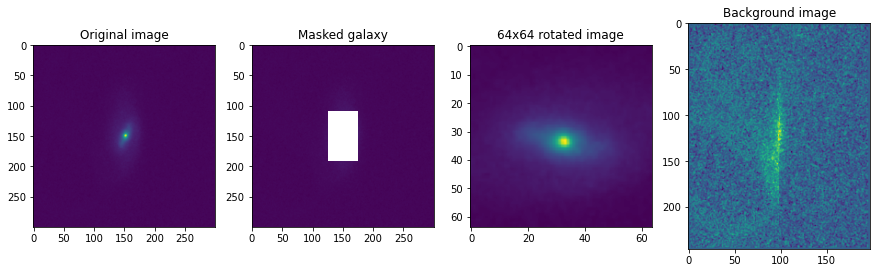

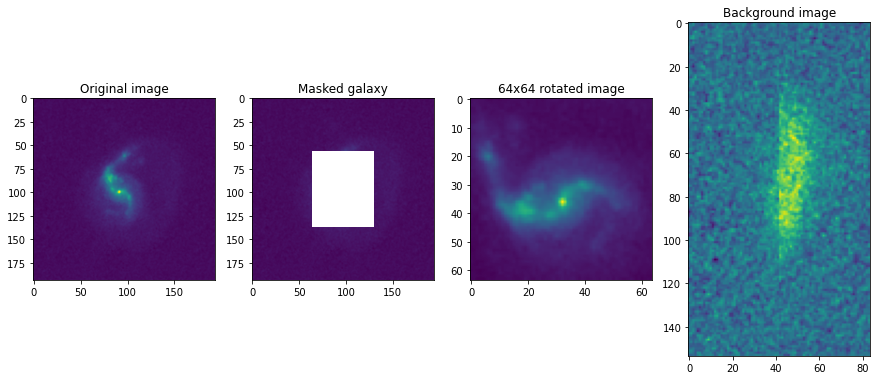

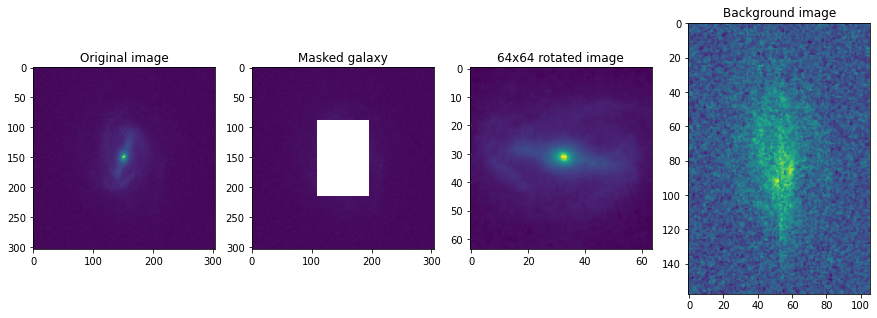

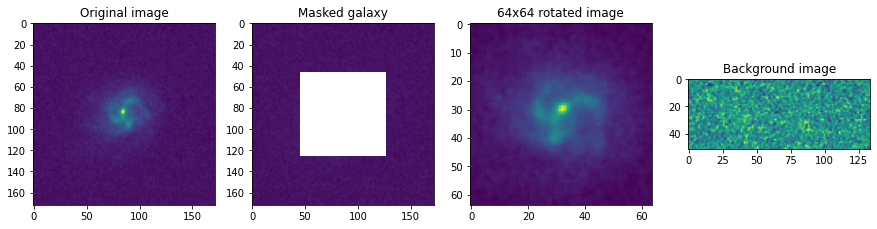

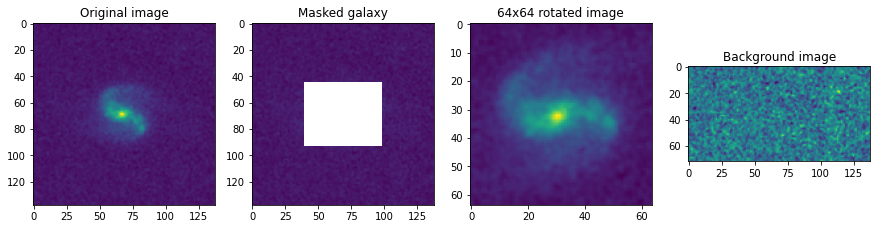

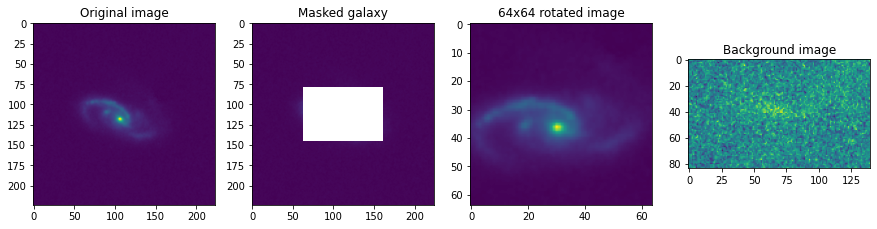

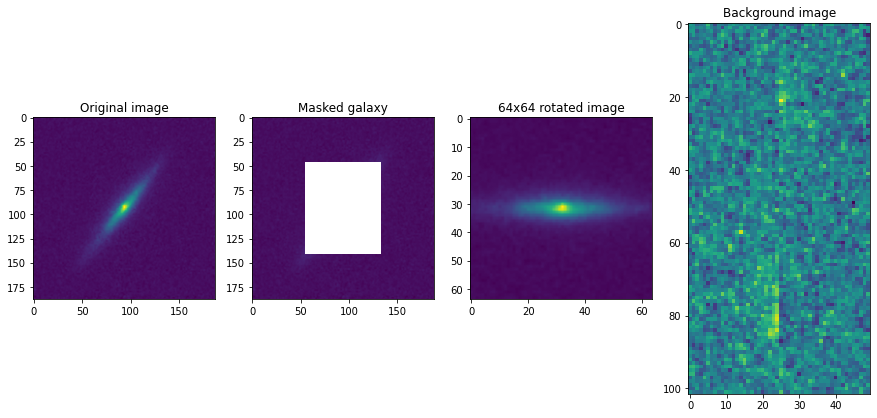

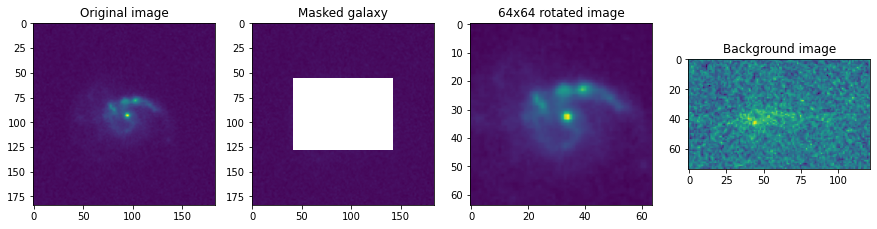

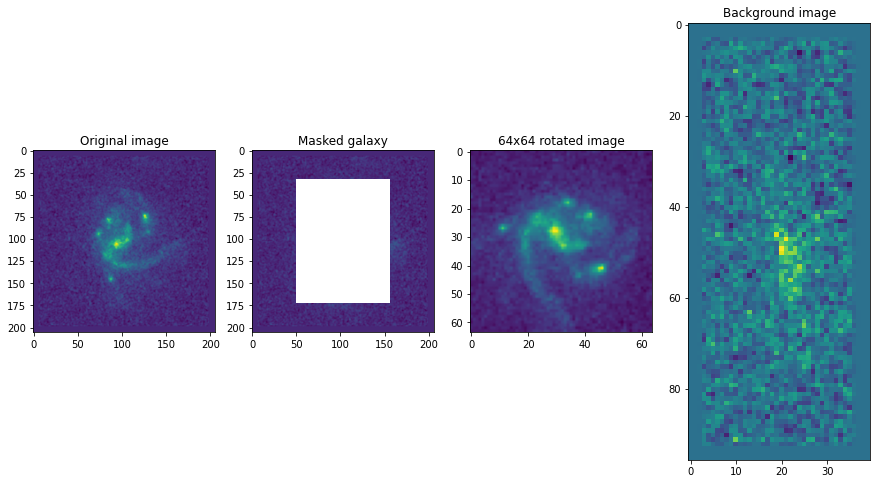

In [21]:
test_galaxies_indices=[518, 33671, 25576, 45805, 31577, 41707, 19844, 13628,  8624]

for i in range(9):
    test_index=test_galaxies_indices[i]
    overview_galaxy_creation(test_index,0.05)

## Randomised samples

There are some cases when Background takes some of outer galaxy's pixels. These pixels only slightly exceed noise in brightness. Moreover, we build our noise estimation on median values, and these pixels are not supposed to drastically aggravate the statistics.

  0%|          | 0/100 [00:00<?, ?it/s]

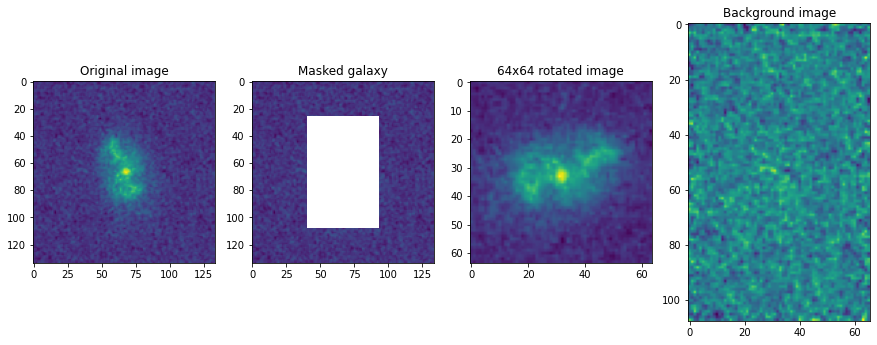

  1%|          | 1/100 [00:00<01:24,  1.18it/s]

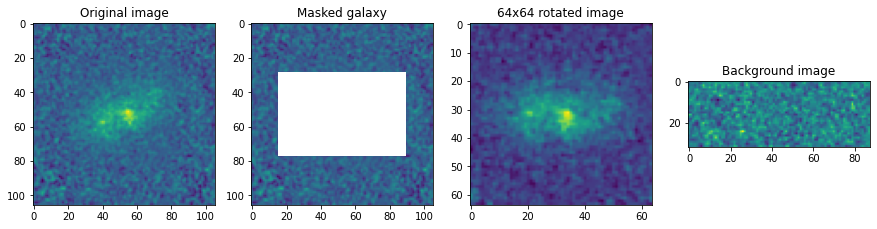

  2%|▏         | 2/100 [00:01<01:16,  1.27it/s]

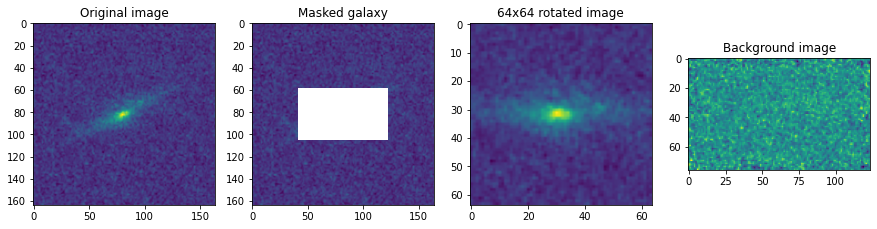

  3%|▎         | 3/100 [00:02<01:32,  1.05it/s]

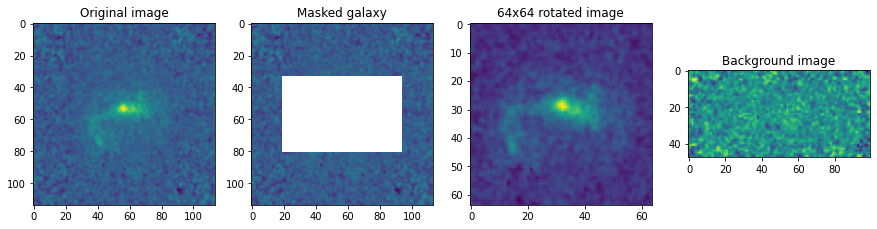

  4%|▍         | 4/100 [00:03<01:19,  1.21it/s]

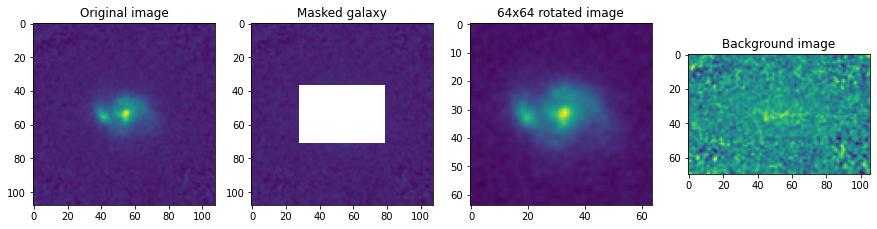

  5%|▌         | 5/100 [00:03<01:10,  1.35it/s]

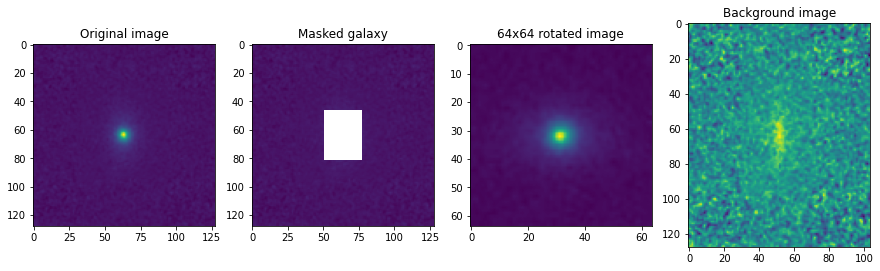

  6%|▌         | 6/100 [00:04<01:10,  1.33it/s]

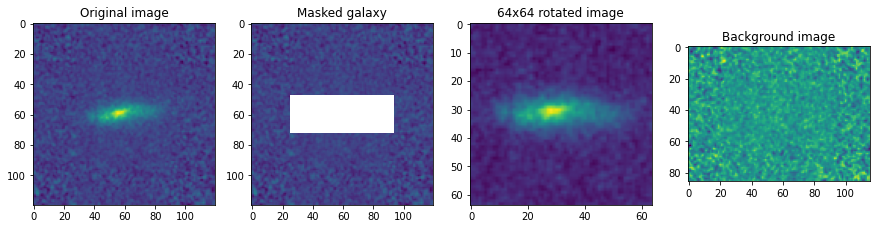

  7%|▋         | 7/100 [00:05<01:08,  1.36it/s]

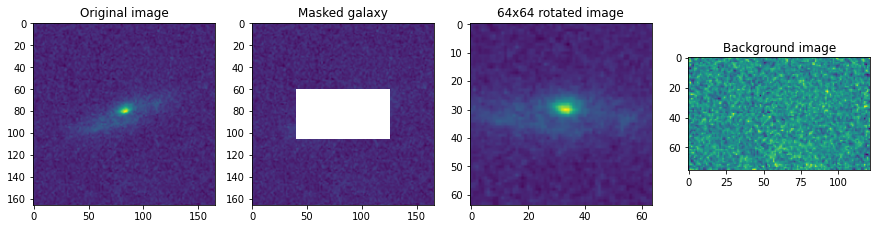

  8%|▊         | 8/100 [00:06<01:22,  1.12it/s]

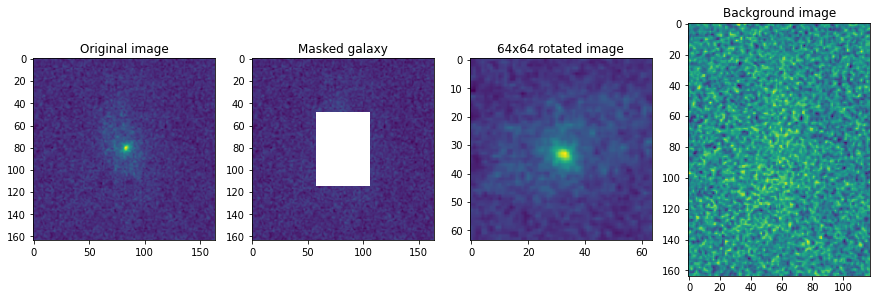

  9%|▉         | 9/100 [00:07<01:30,  1.00it/s]

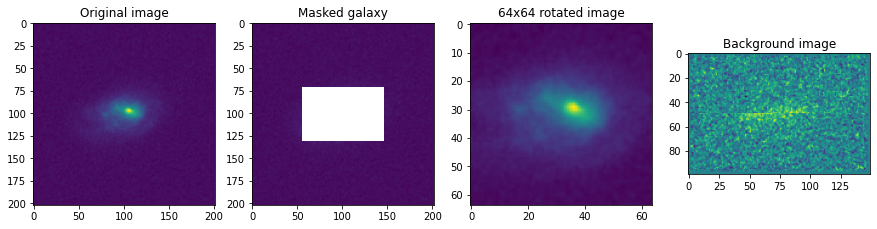

 10%|█         | 10/100 [00:09<01:47,  1.20s/it]

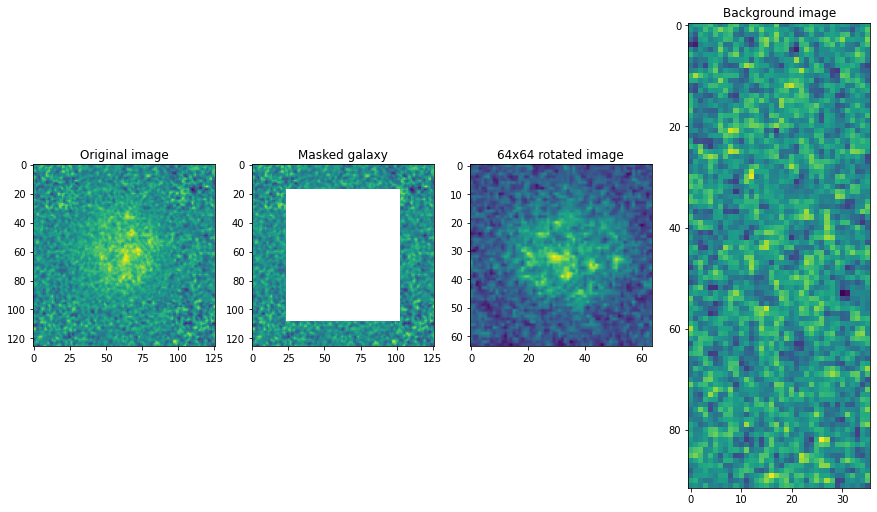

 11%|█         | 11/100 [00:10<01:35,  1.07s/it]

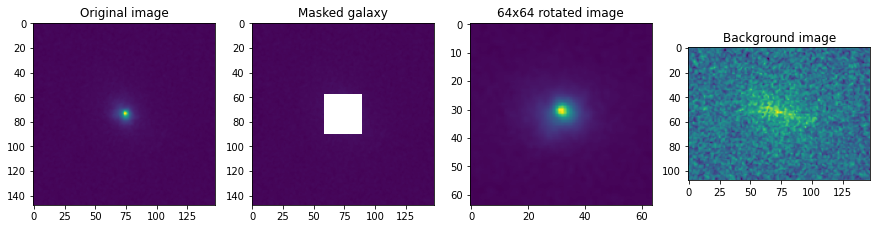

 12%|█▏        | 12/100 [00:11<01:28,  1.01s/it]

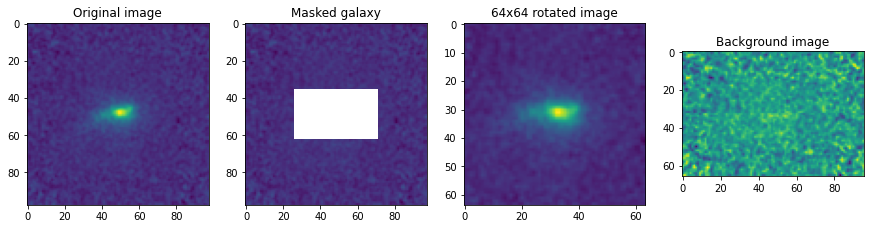

 13%|█▎        | 13/100 [00:11<01:18,  1.10it/s]

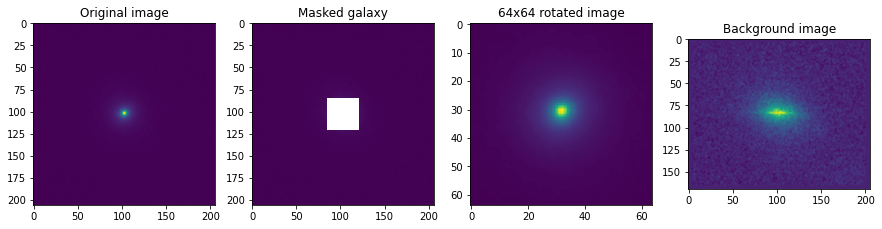

 14%|█▍        | 14/100 [00:13<01:32,  1.08s/it]

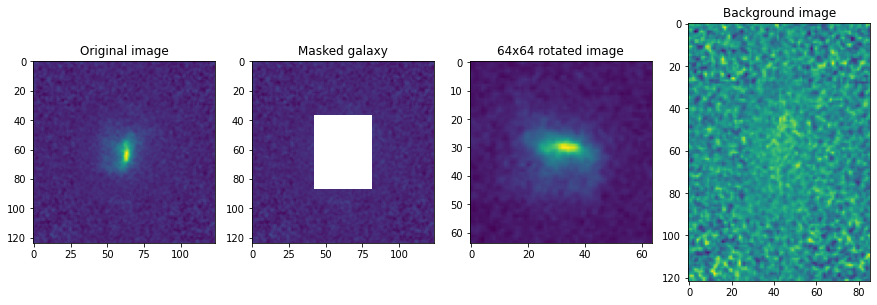

 15%|█▌        | 15/100 [00:14<01:23,  1.01it/s]

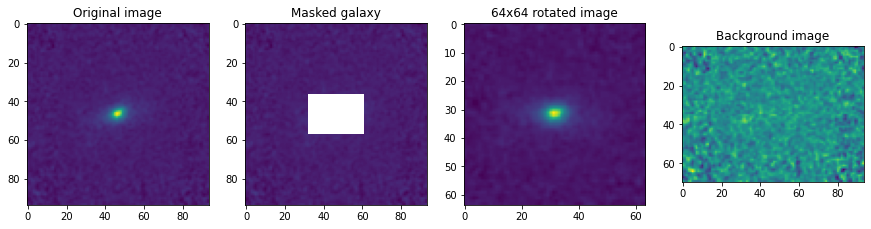

 16%|█▌        | 16/100 [00:14<01:10,  1.20it/s]

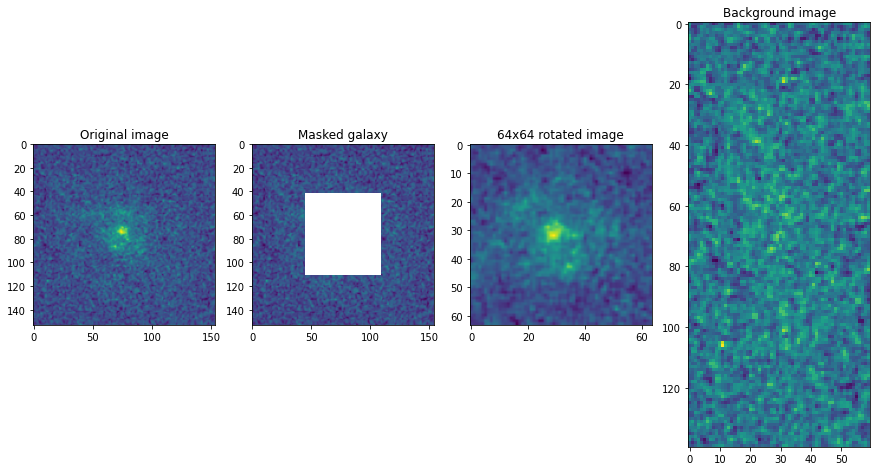

 17%|█▋        | 17/100 [00:15<01:13,  1.13it/s]

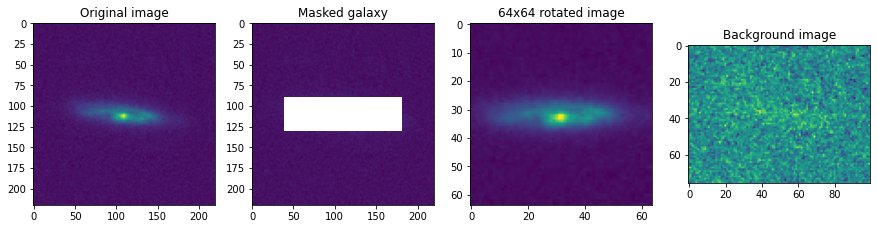

 18%|█▊        | 18/100 [00:17<01:34,  1.16s/it]

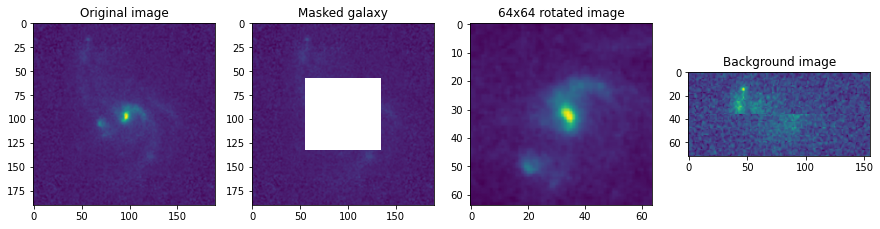

 19%|█▉        | 19/100 [00:19<01:45,  1.30s/it]

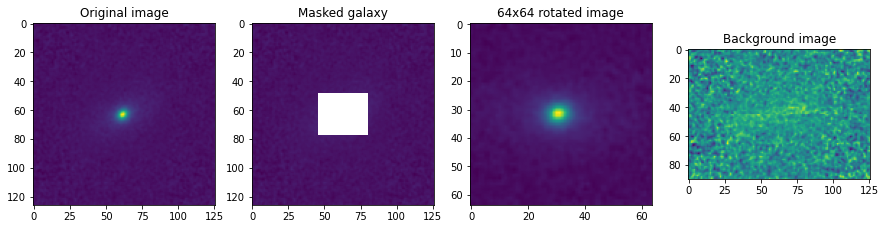

 20%|██        | 20/100 [00:19<01:29,  1.12s/it]

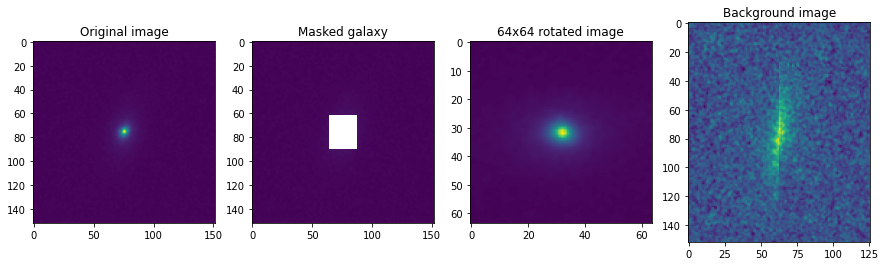

 21%|██        | 21/100 [00:20<01:24,  1.07s/it]

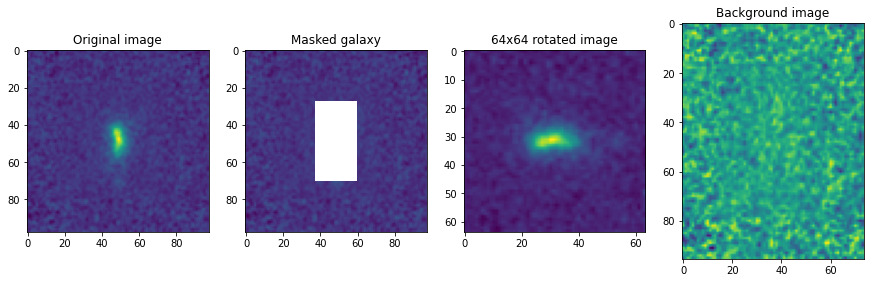

 22%|██▏       | 22/100 [00:21<01:12,  1.07it/s]

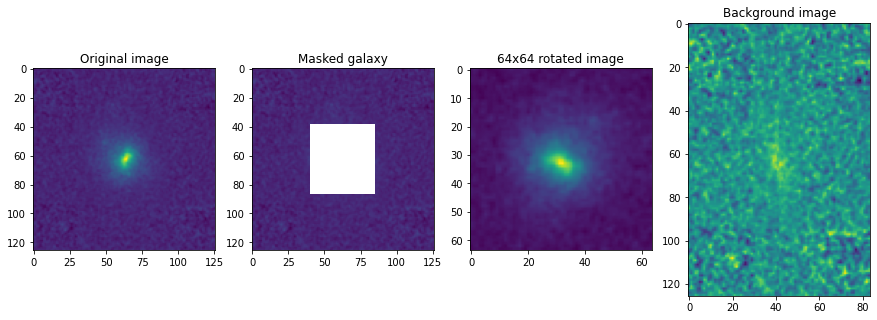

 23%|██▎       | 23/100 [00:22<01:07,  1.13it/s]

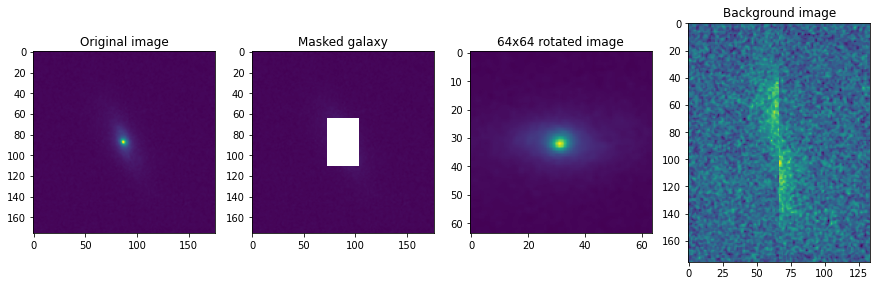

 24%|██▍       | 24/100 [00:23<01:20,  1.06s/it]

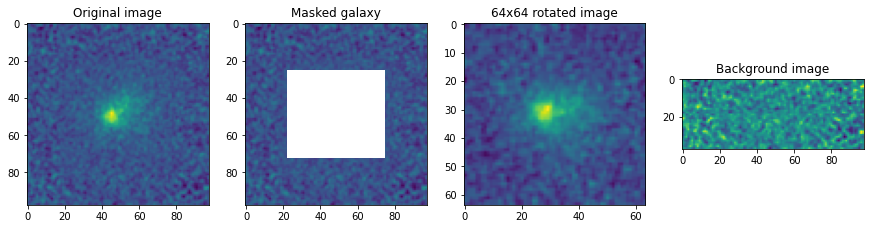

 25%|██▌       | 25/100 [00:24<01:08,  1.10it/s]

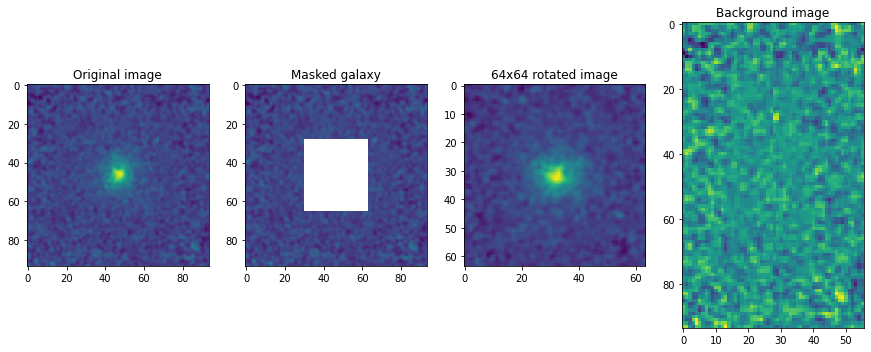

 26%|██▌       | 26/100 [00:24<00:58,  1.26it/s]

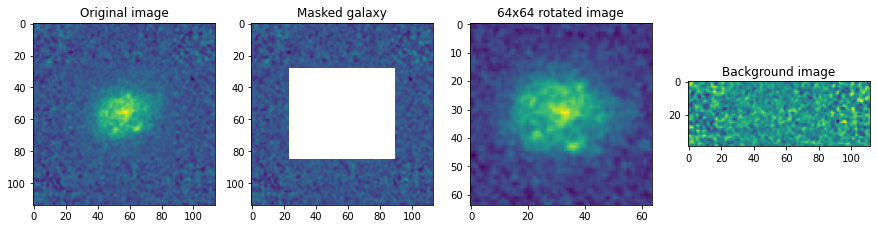

 27%|██▋       | 27/100 [00:25<01:03,  1.15it/s]

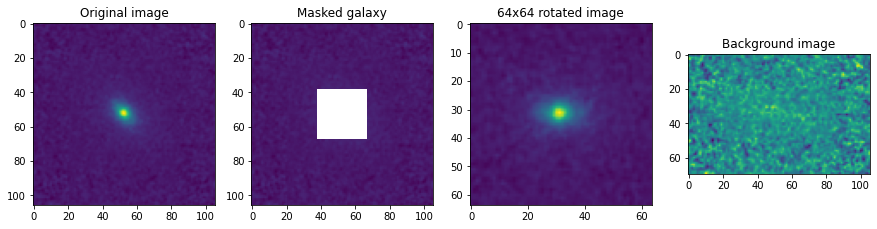

 28%|██▊       | 28/100 [00:26<00:55,  1.30it/s]

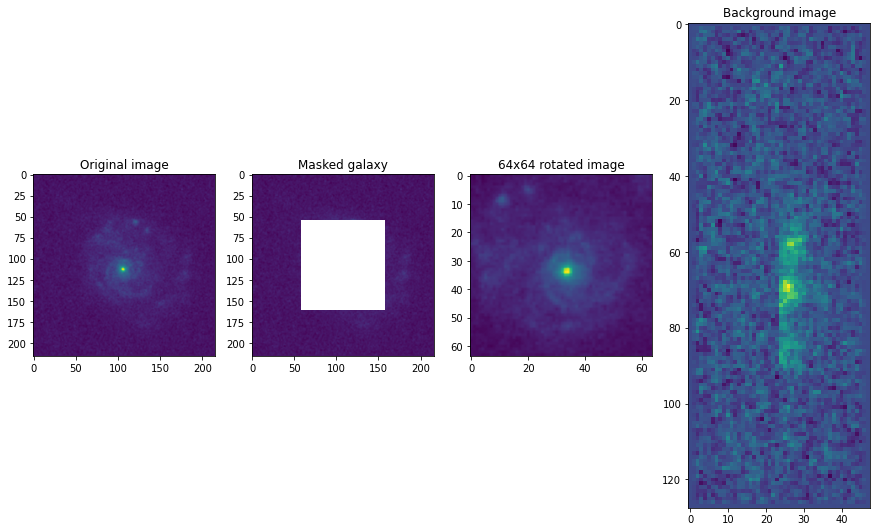

 29%|██▉       | 29/100 [00:28<01:19,  1.12s/it]

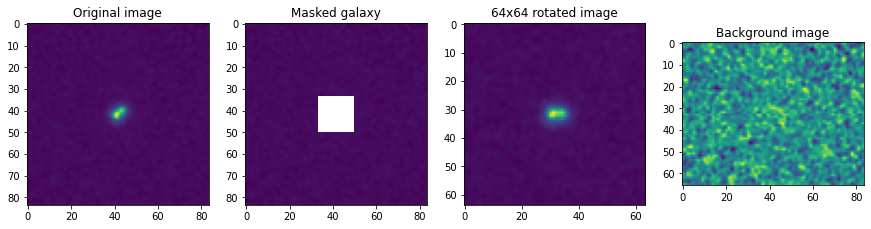

 30%|███       | 30/100 [00:28<01:04,  1.09it/s]

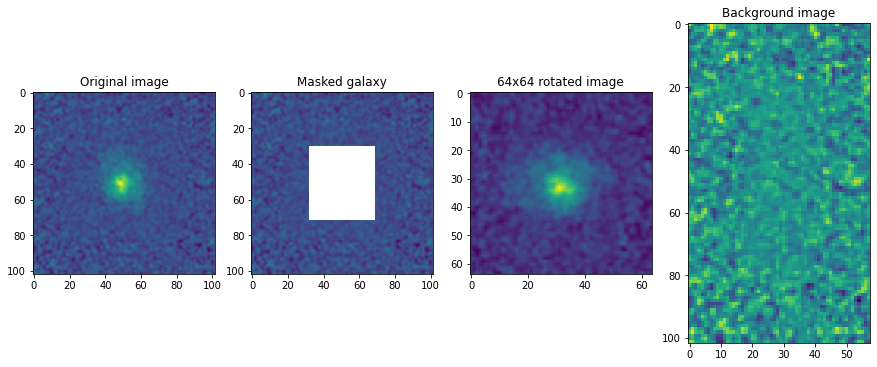

 31%|███       | 31/100 [00:29<00:56,  1.22it/s]

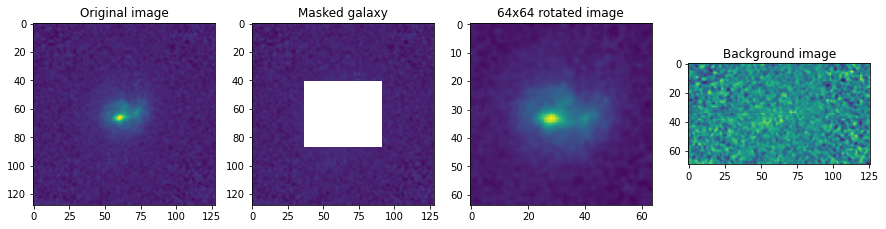

 32%|███▏      | 32/100 [00:30<01:03,  1.08it/s]

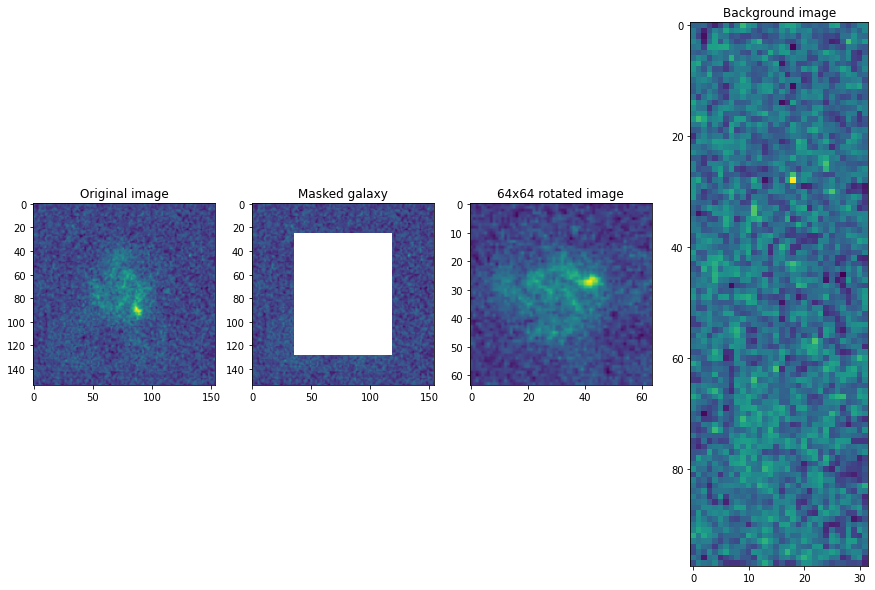

 33%|███▎      | 33/100 [00:31<01:04,  1.04it/s]

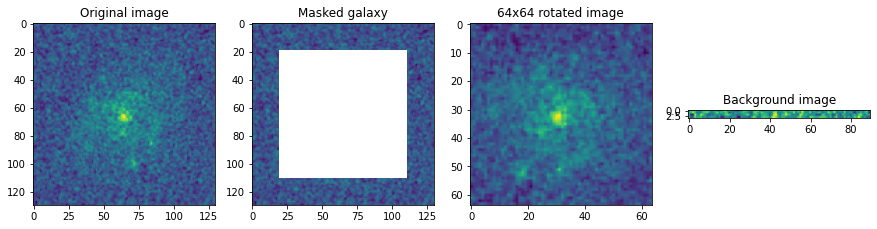

 34%|███▍      | 34/100 [00:32<01:06,  1.01s/it]

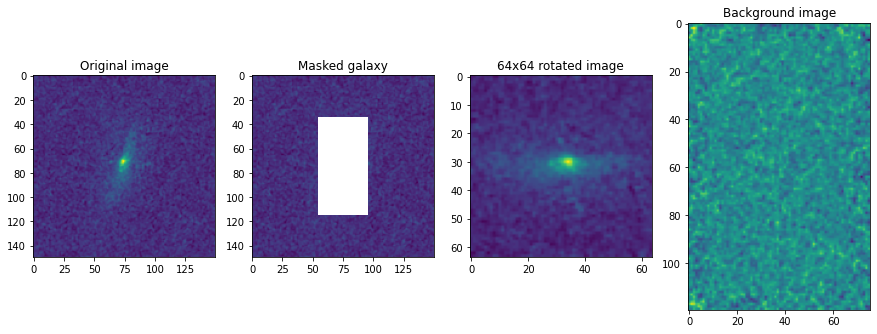

 35%|███▌      | 35/100 [00:33<01:06,  1.02s/it]

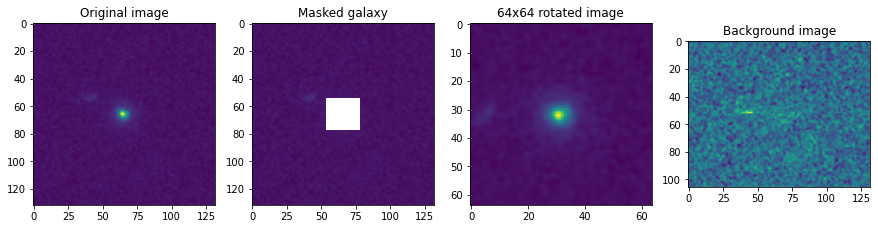

 36%|███▌      | 36/100 [00:34<00:59,  1.07it/s]

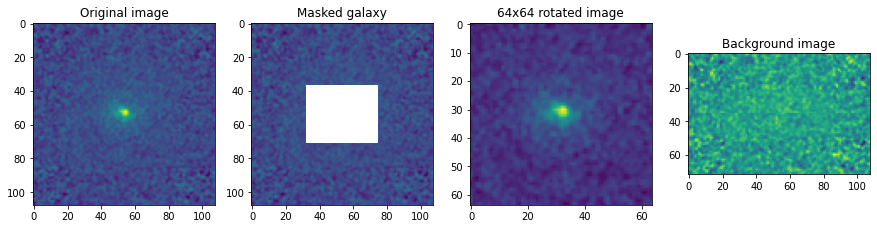

 37%|███▋      | 37/100 [00:34<00:51,  1.22it/s]

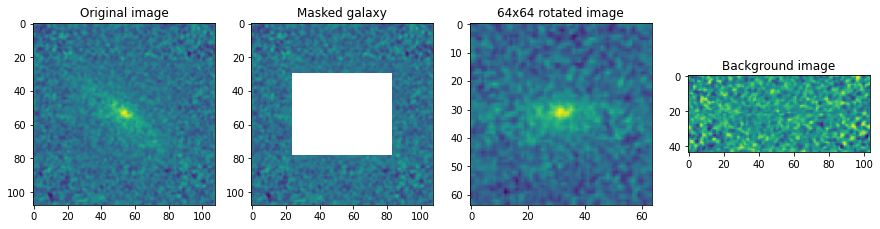

 38%|███▊      | 38/100 [00:35<00:46,  1.33it/s]

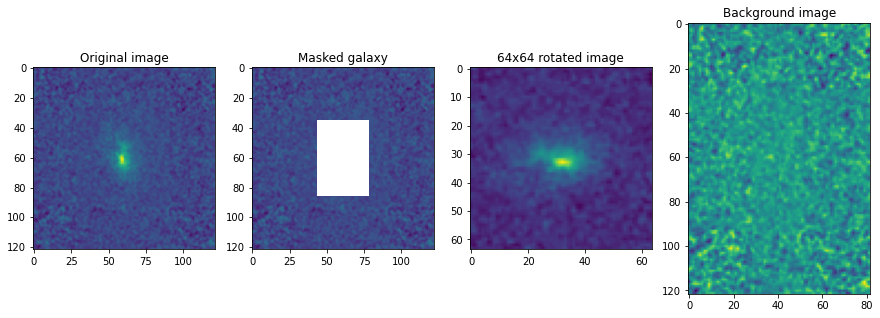

 39%|███▉      | 39/100 [00:36<00:45,  1.35it/s]

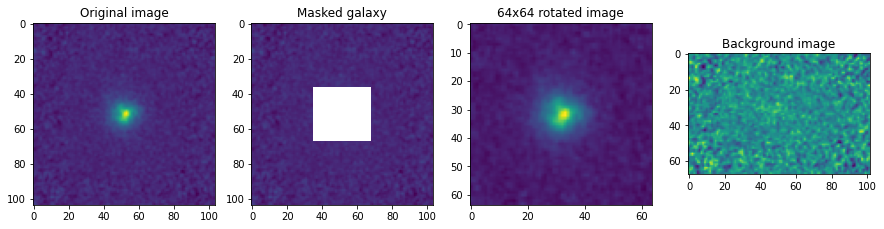

 40%|████      | 40/100 [00:36<00:41,  1.45it/s]

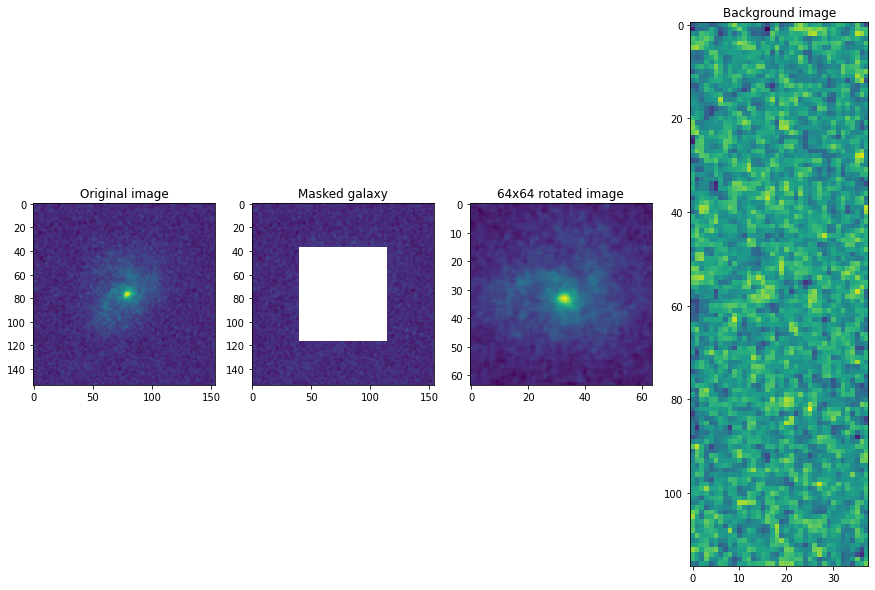

 41%|████      | 41/100 [00:37<00:47,  1.24it/s]

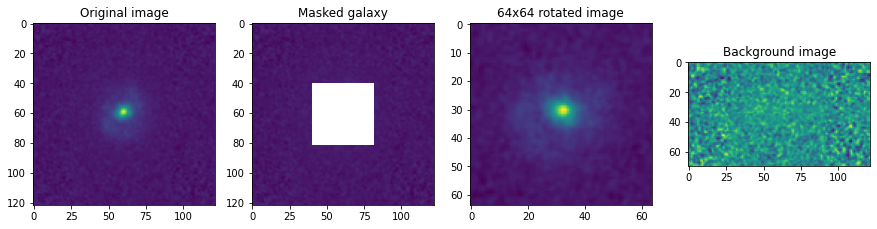

 42%|████▏     | 42/100 [00:38<00:43,  1.33it/s]

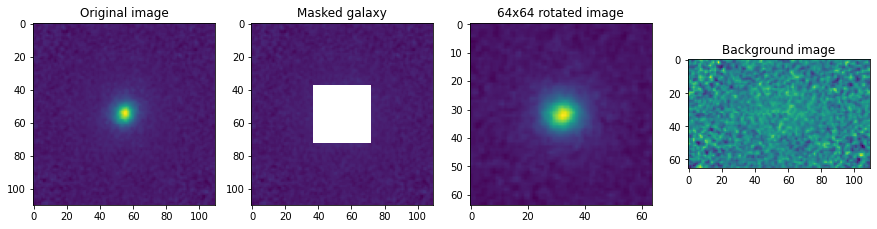

 43%|████▎     | 43/100 [00:39<00:40,  1.39it/s]

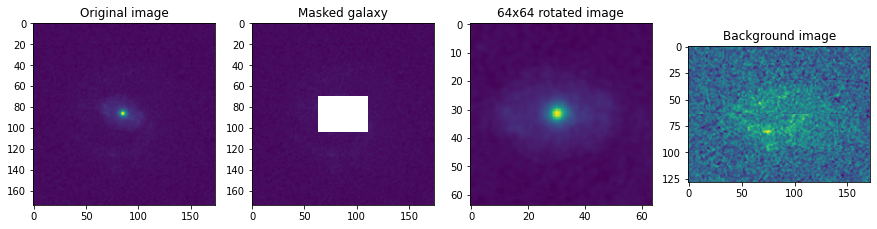

 44%|████▍     | 44/100 [00:40<00:56,  1.01s/it]

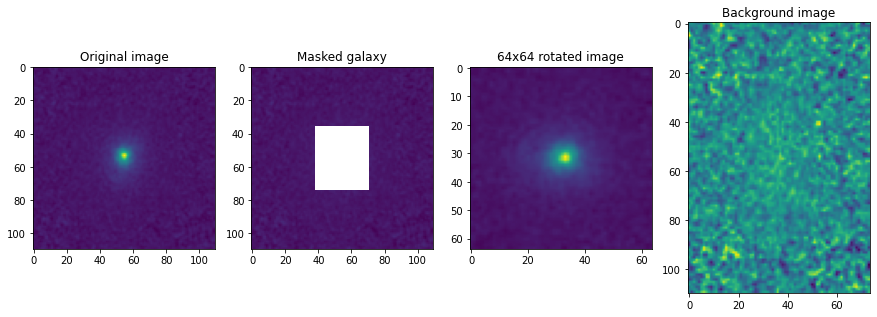

 45%|████▌     | 45/100 [00:41<00:51,  1.06it/s]

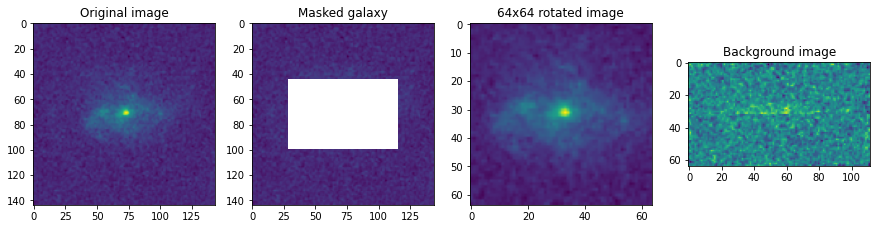

 46%|████▌     | 46/100 [00:42<00:48,  1.11it/s]

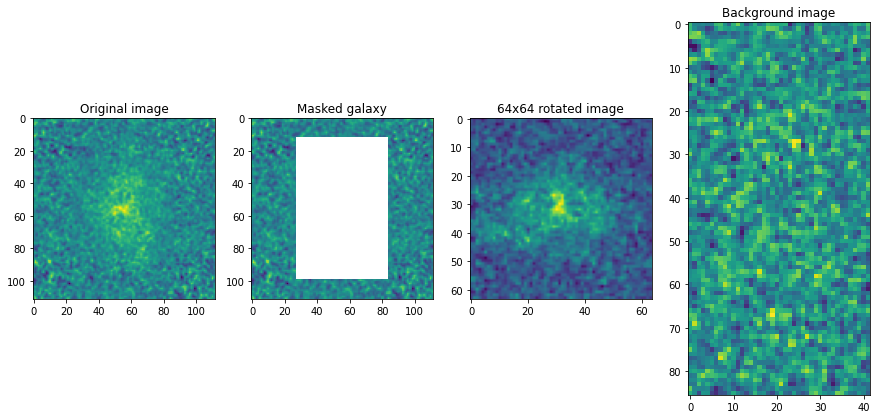

 47%|████▋     | 47/100 [00:43<00:43,  1.21it/s]

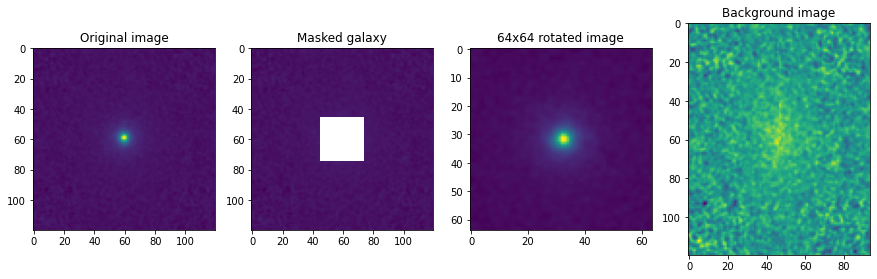

 48%|████▊     | 48/100 [00:43<00:41,  1.25it/s]

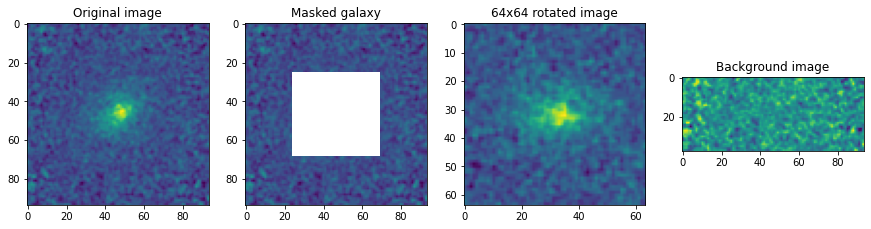

 49%|████▉     | 49/100 [00:44<00:35,  1.42it/s]

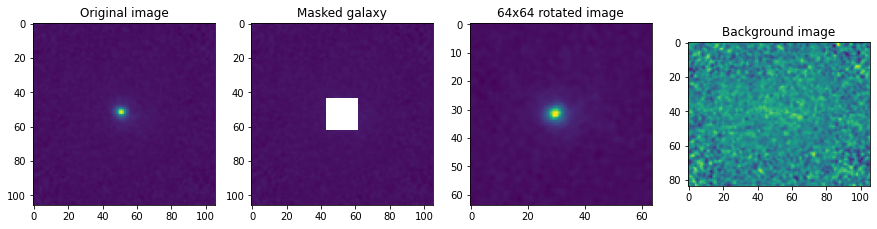

 50%|█████     | 50/100 [00:44<00:35,  1.42it/s]

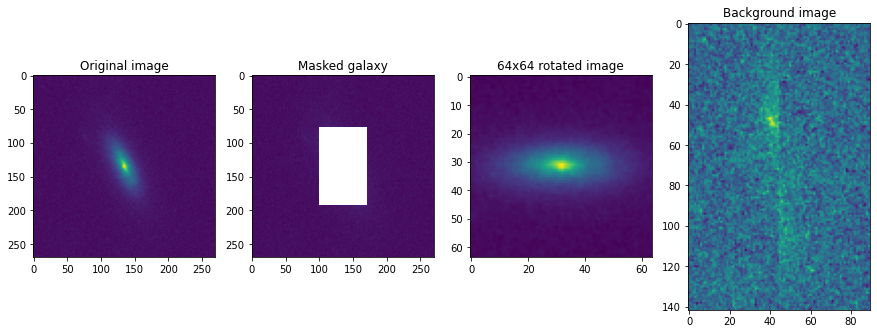

 51%|█████     | 51/100 [00:47<00:57,  1.17s/it]

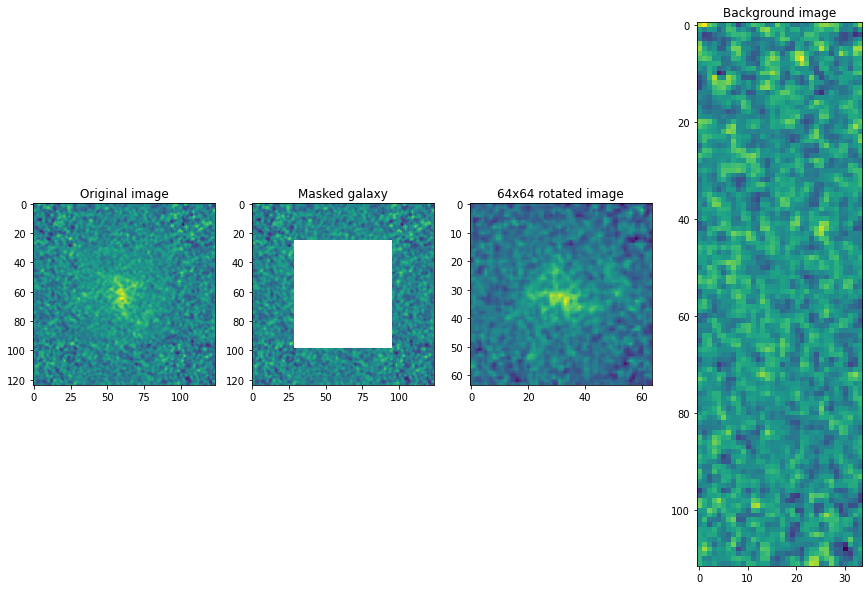

 52%|█████▏    | 52/100 [00:47<00:49,  1.03s/it]

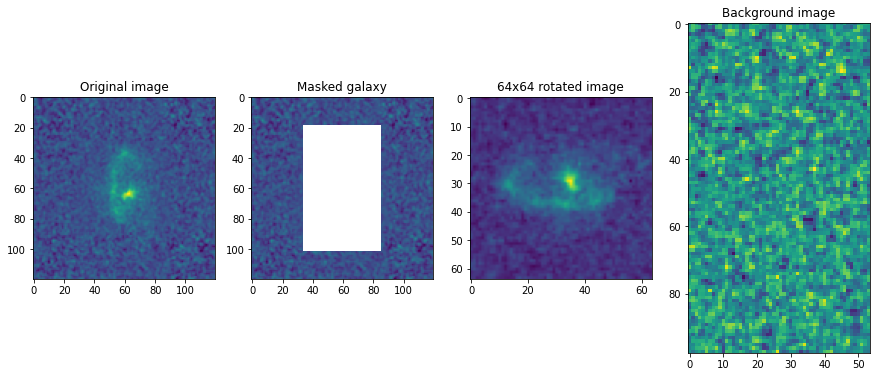

 53%|█████▎    | 53/100 [00:48<00:48,  1.03s/it]

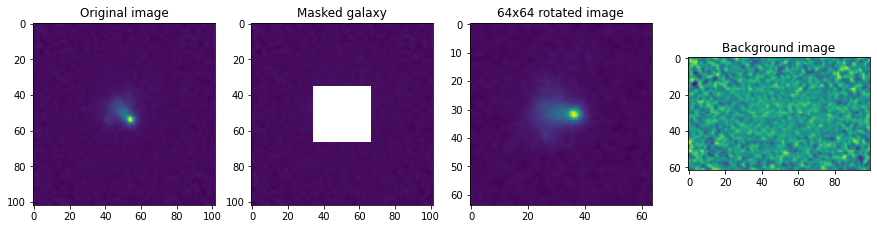

 54%|█████▍    | 54/100 [00:49<00:40,  1.13it/s]

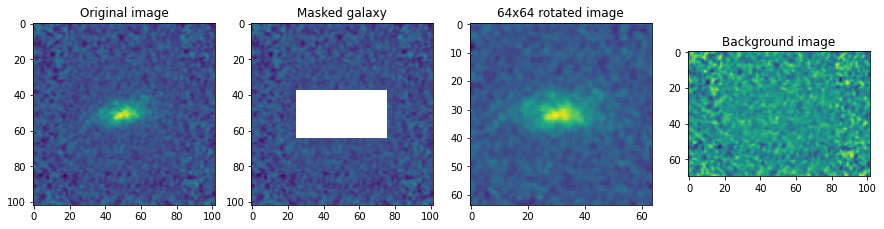

 55%|█████▌    | 55/100 [00:50<00:37,  1.21it/s]

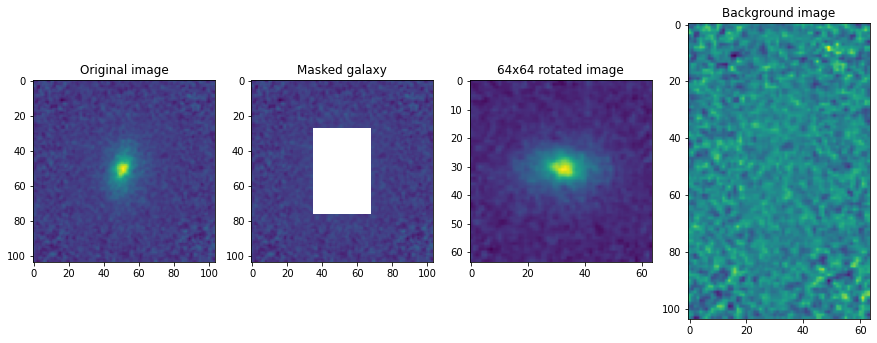

 56%|█████▌    | 56/100 [00:50<00:33,  1.33it/s]

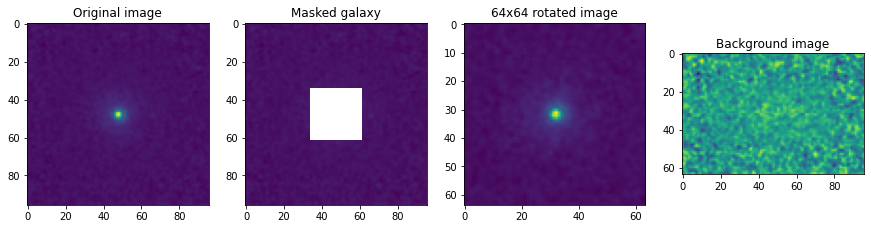

 57%|█████▋    | 57/100 [00:51<00:30,  1.42it/s]

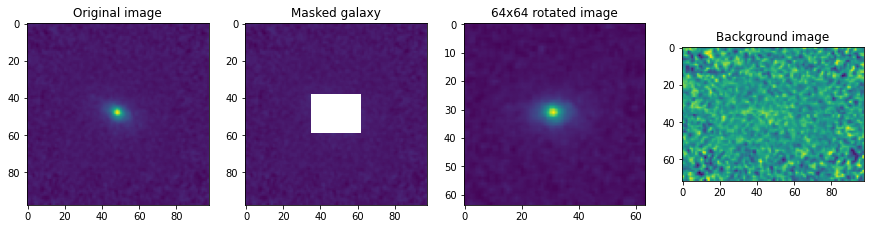

 58%|█████▊    | 58/100 [00:51<00:26,  1.57it/s]

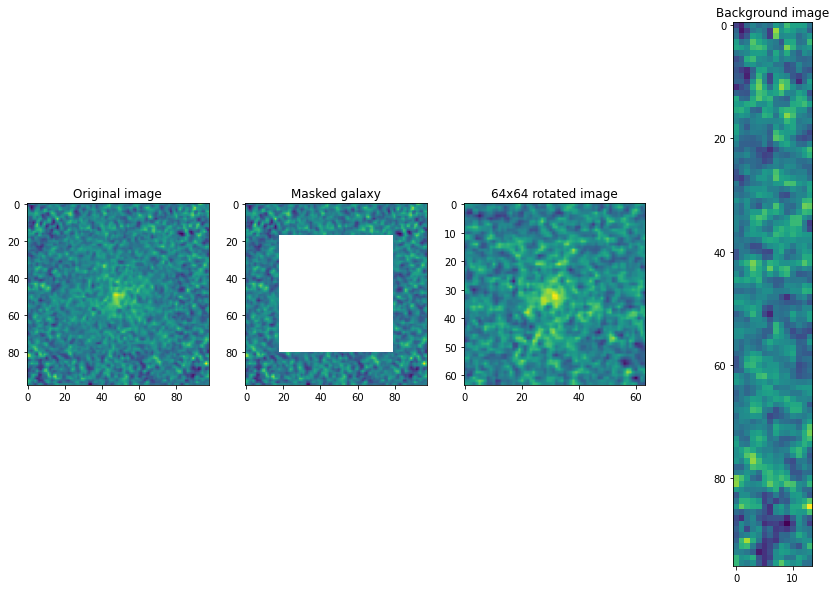

 59%|█████▉    | 59/100 [00:52<00:25,  1.63it/s]

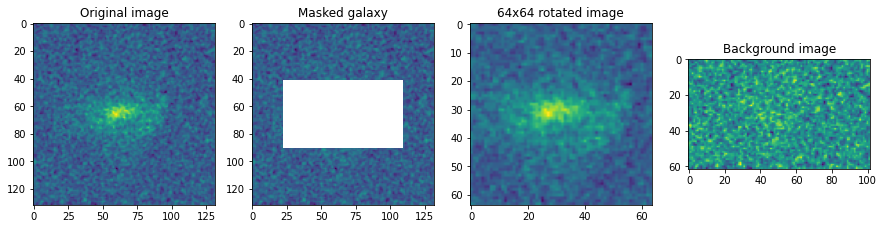

 60%|██████    | 60/100 [00:53<00:27,  1.45it/s]

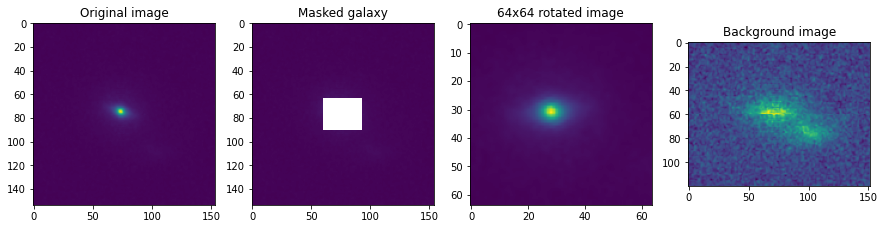

 61%|██████    | 61/100 [00:54<00:28,  1.35it/s]

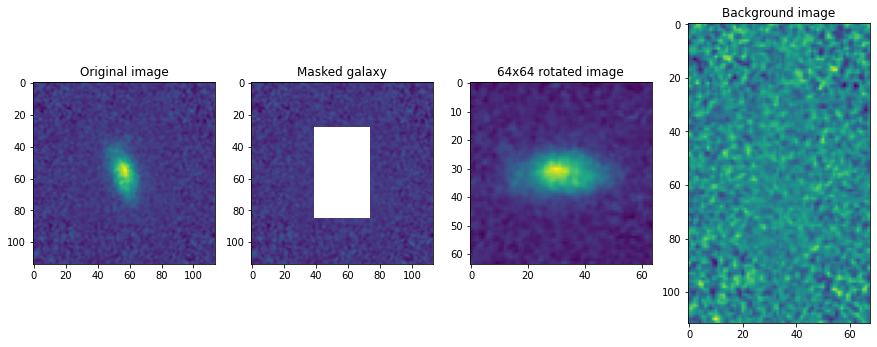

 62%|██████▏   | 62/100 [00:54<00:27,  1.37it/s]

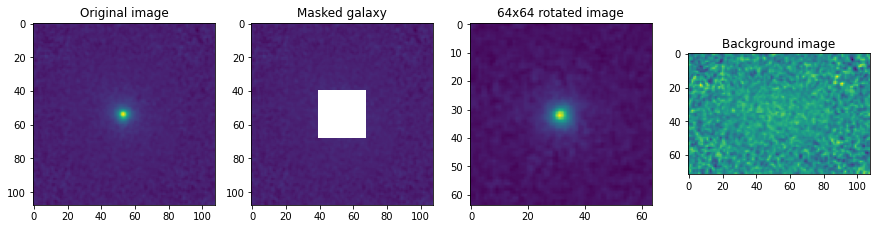

 63%|██████▎   | 63/100 [00:55<00:25,  1.45it/s]

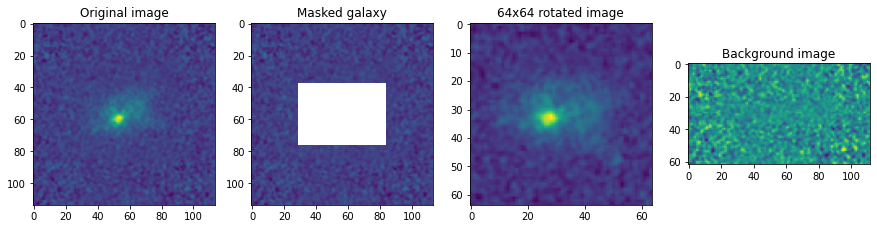

 64%|██████▍   | 64/100 [00:56<00:25,  1.43it/s]

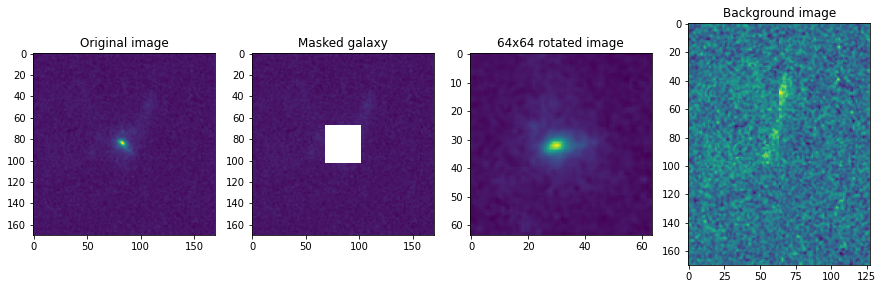

 65%|██████▌   | 65/100 [00:57<00:29,  1.19it/s]

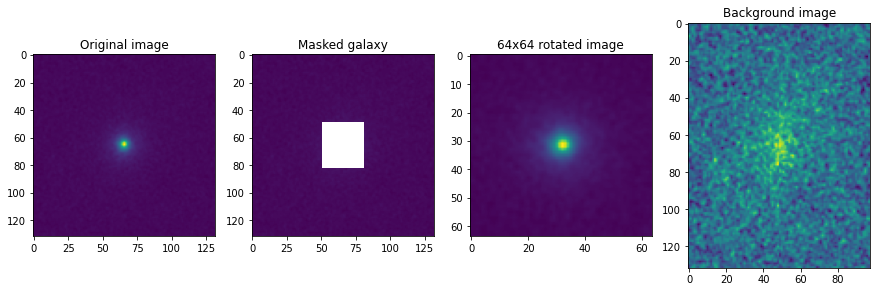

 66%|██████▌   | 66/100 [00:58<00:30,  1.13it/s]

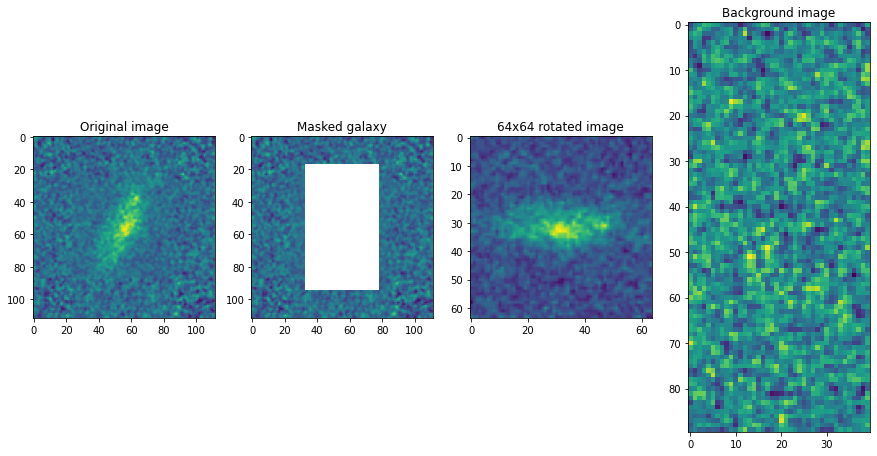

 67%|██████▋   | 67/100 [00:58<00:27,  1.21it/s]

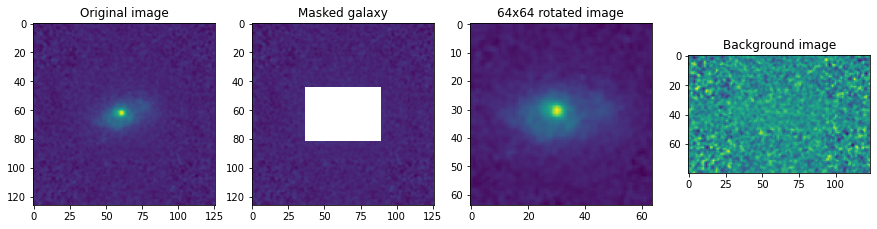

 68%|██████▊   | 68/100 [00:59<00:25,  1.26it/s]

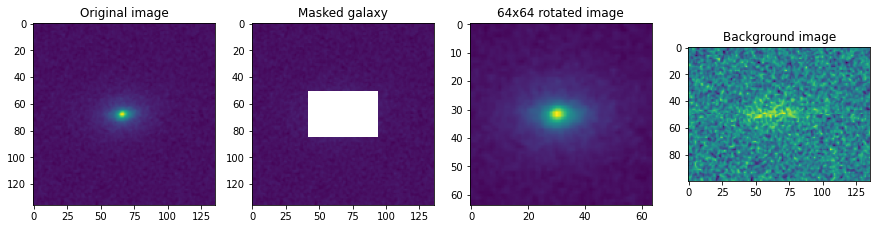

 69%|██████▉   | 69/100 [01:00<00:23,  1.32it/s]

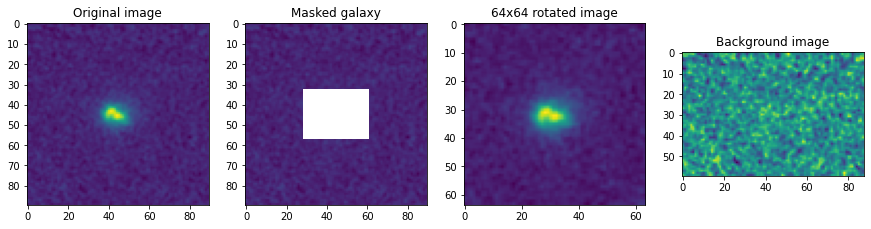

 70%|███████   | 70/100 [01:01<00:22,  1.36it/s]

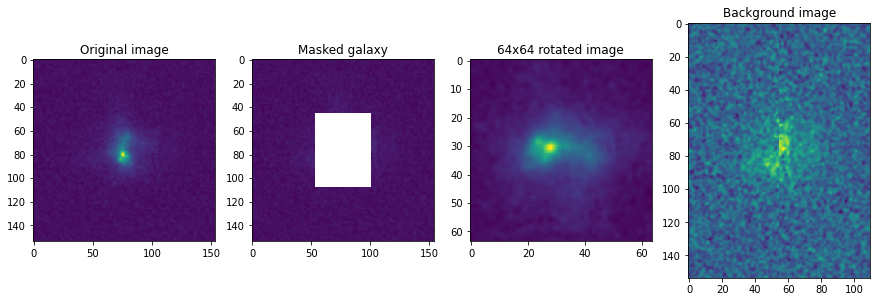

 71%|███████   | 71/100 [01:02<00:28,  1.02it/s]

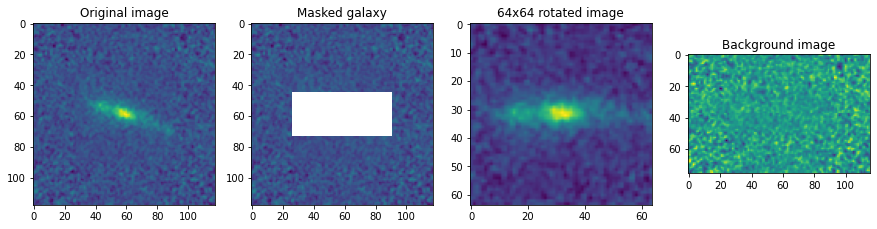

 72%|███████▏  | 72/100 [01:03<00:24,  1.14it/s]

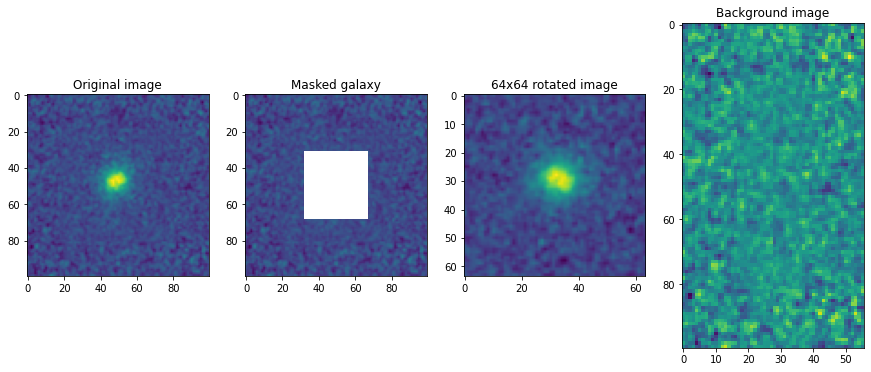

 73%|███████▎  | 73/100 [01:03<00:20,  1.30it/s]

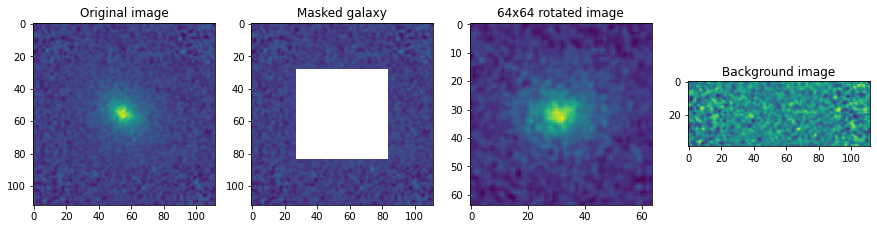

 74%|███████▍  | 74/100 [01:04<00:19,  1.33it/s]

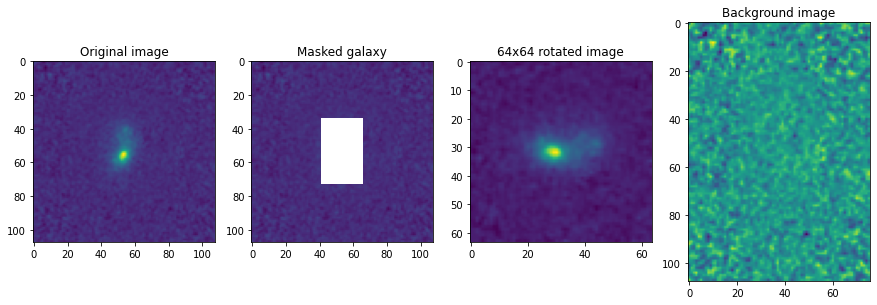

 75%|███████▌  | 75/100 [01:05<00:18,  1.39it/s]

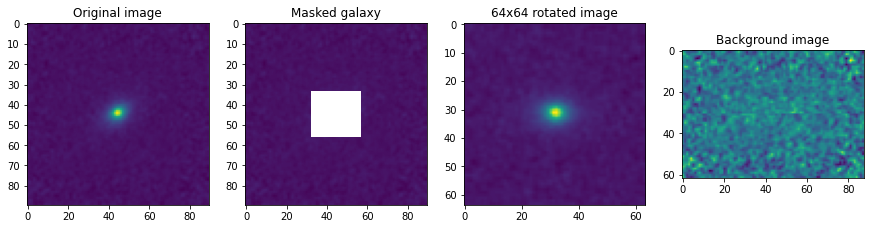

 76%|███████▌  | 76/100 [01:05<00:18,  1.31it/s]

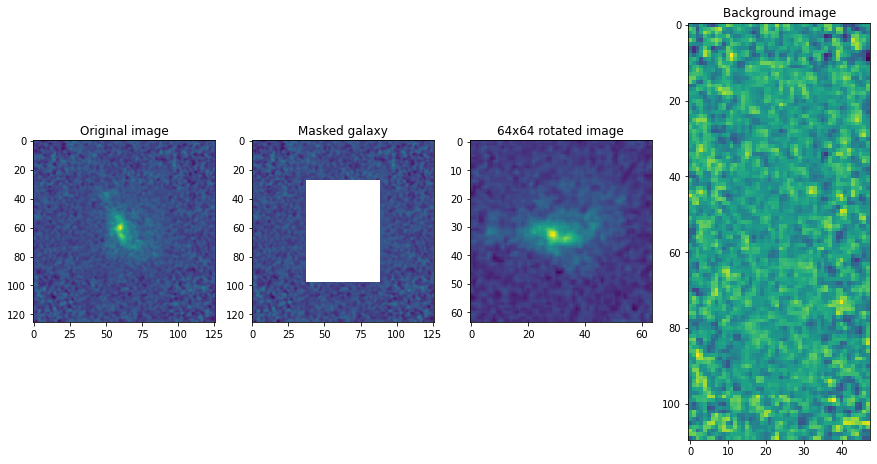

 77%|███████▋  | 77/100 [01:06<00:18,  1.22it/s]

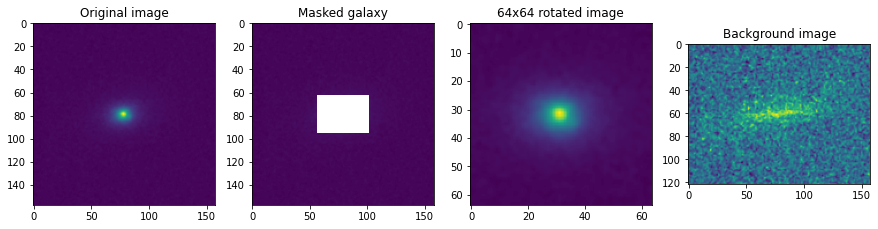

 78%|███████▊  | 78/100 [01:07<00:18,  1.20it/s]

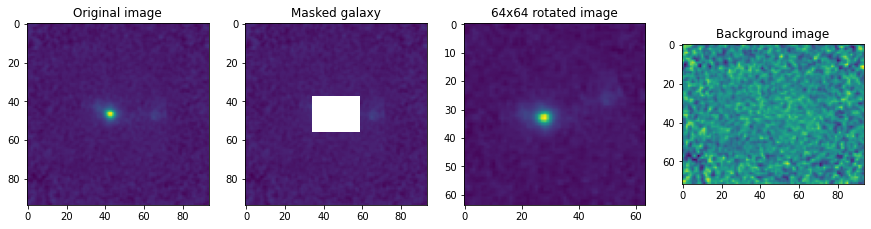

 79%|███████▉  | 79/100 [01:08<00:16,  1.27it/s]

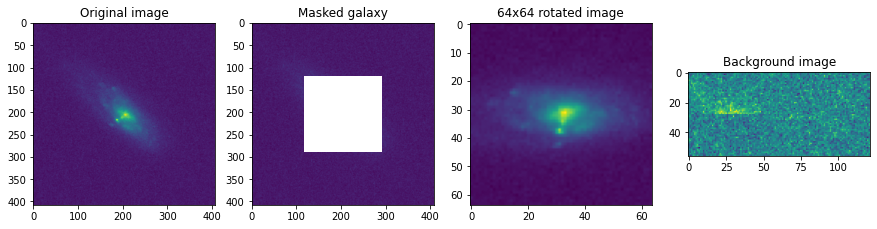

 80%|████████  | 80/100 [01:13<00:39,  1.96s/it]

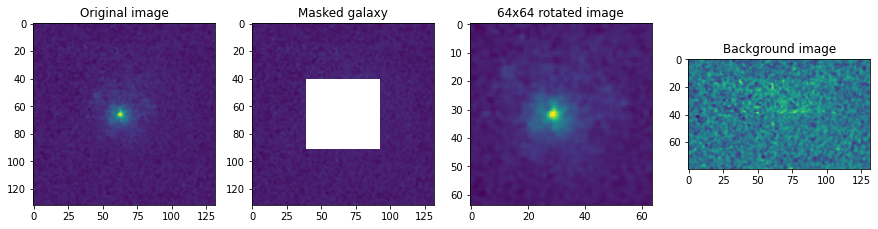

 81%|████████  | 81/100 [01:14<00:30,  1.63s/it]

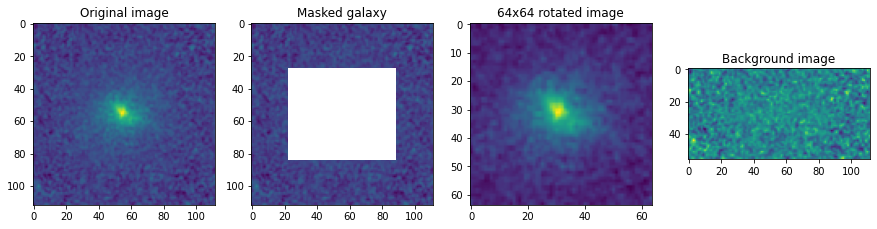

 82%|████████▏ | 82/100 [01:14<00:24,  1.38s/it]

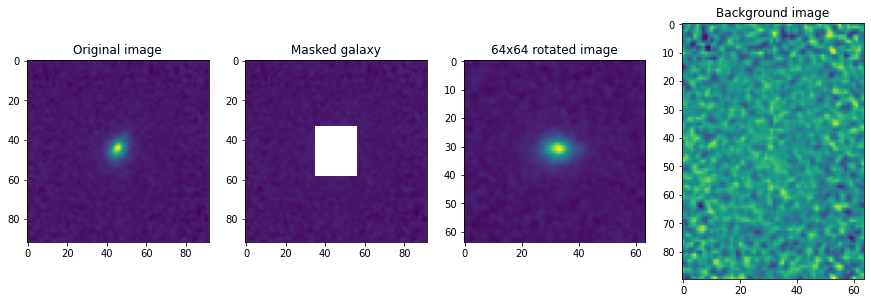

 83%|████████▎ | 83/100 [01:15<00:18,  1.12s/it]

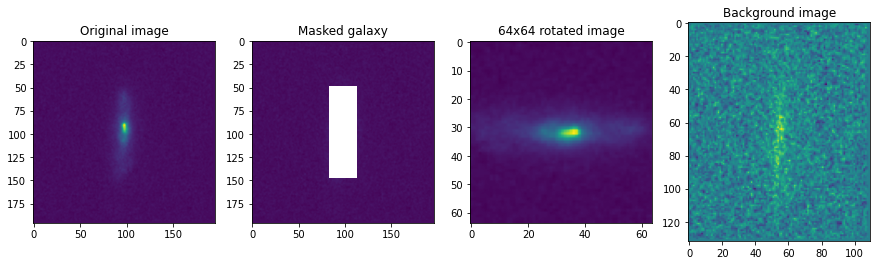

 84%|████████▍ | 84/100 [01:16<00:19,  1.24s/it]

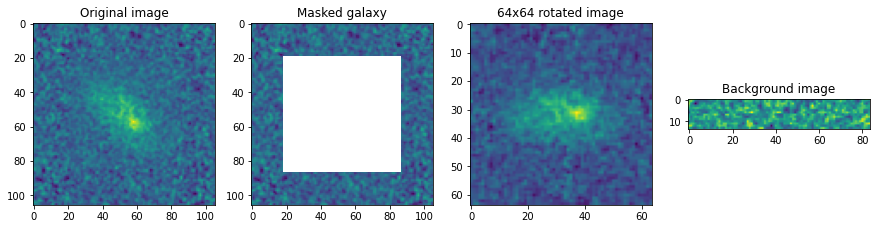

 85%|████████▌ | 85/100 [01:17<00:15,  1.05s/it]

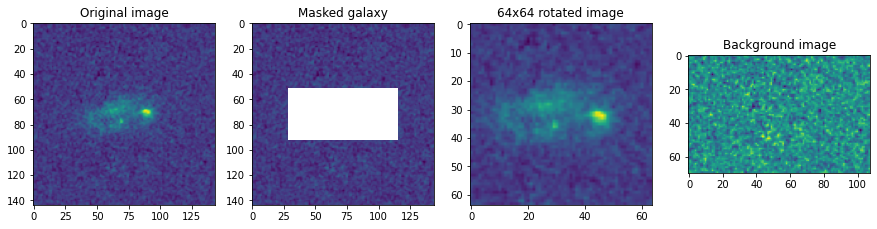

 86%|████████▌ | 86/100 [01:18<00:13,  1.01it/s]

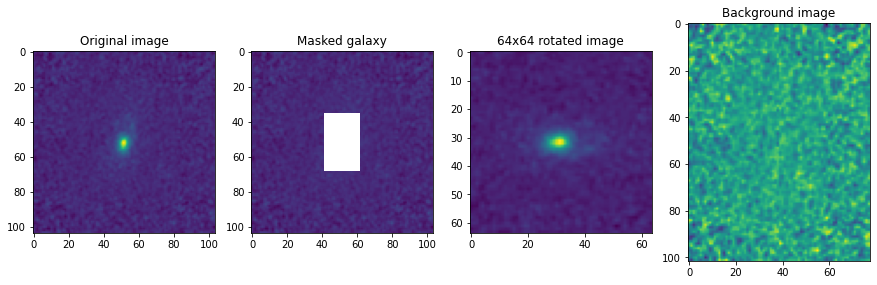

 87%|████████▋ | 87/100 [01:19<00:11,  1.09it/s]

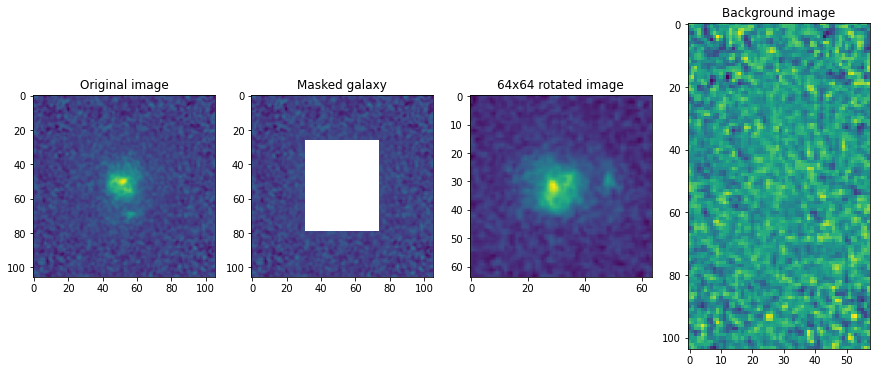

 88%|████████▊ | 88/100 [01:19<00:09,  1.22it/s]

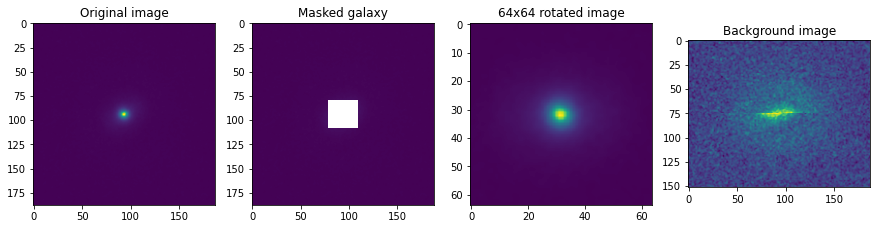

 89%|████████▉ | 89/100 [01:20<00:10,  1.09it/s]

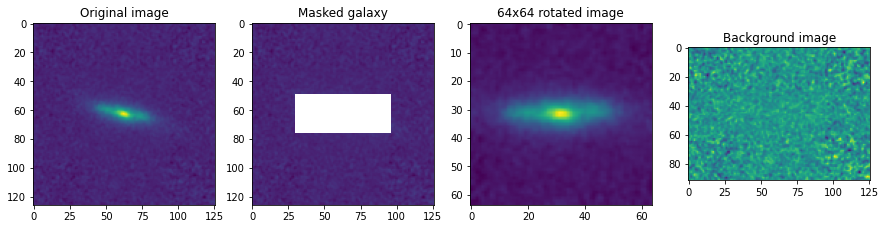

 90%|█████████ | 90/100 [01:21<00:09,  1.06it/s]

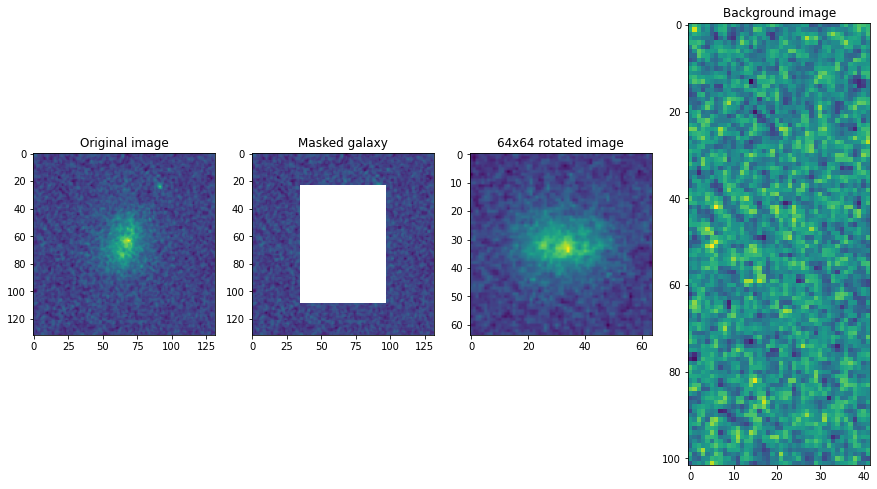

 91%|█████████ | 91/100 [01:22<00:07,  1.13it/s]

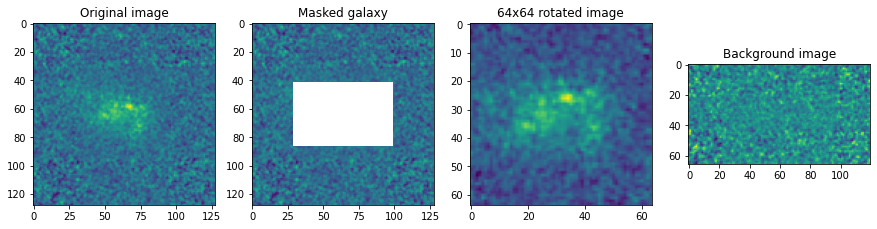

 92%|█████████▏| 92/100 [01:23<00:06,  1.19it/s]

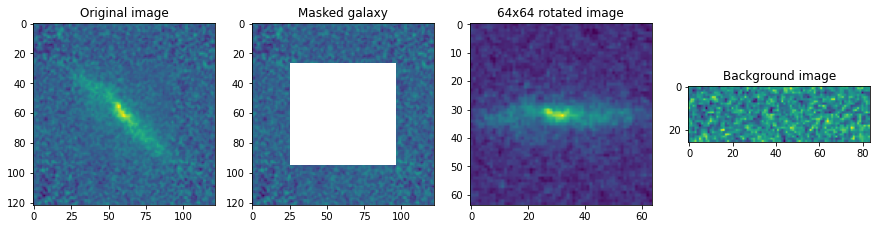

 93%|█████████▎| 93/100 [01:24<00:05,  1.23it/s]

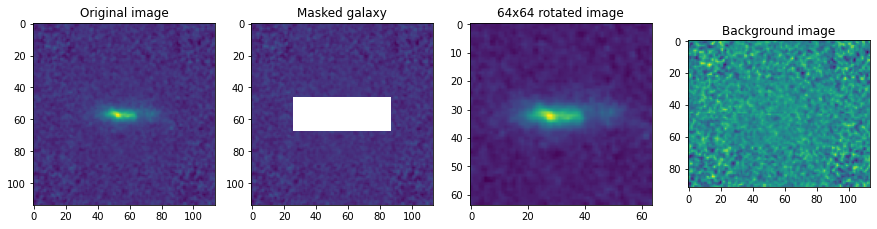

 94%|█████████▍| 94/100 [01:24<00:04,  1.34it/s]

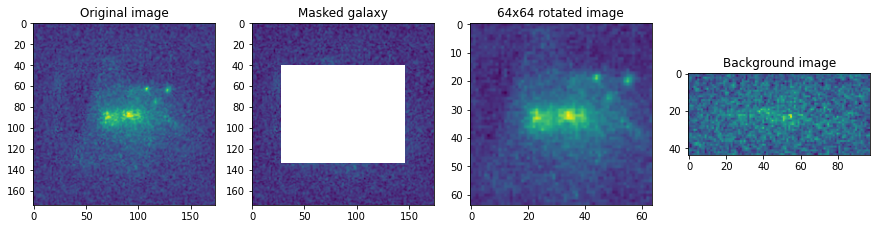

 95%|█████████▌| 95/100 [01:26<00:04,  1.01it/s]

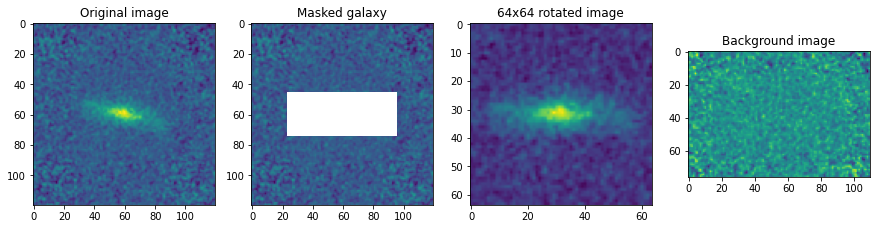

 96%|█████████▌| 96/100 [01:26<00:03,  1.12it/s]

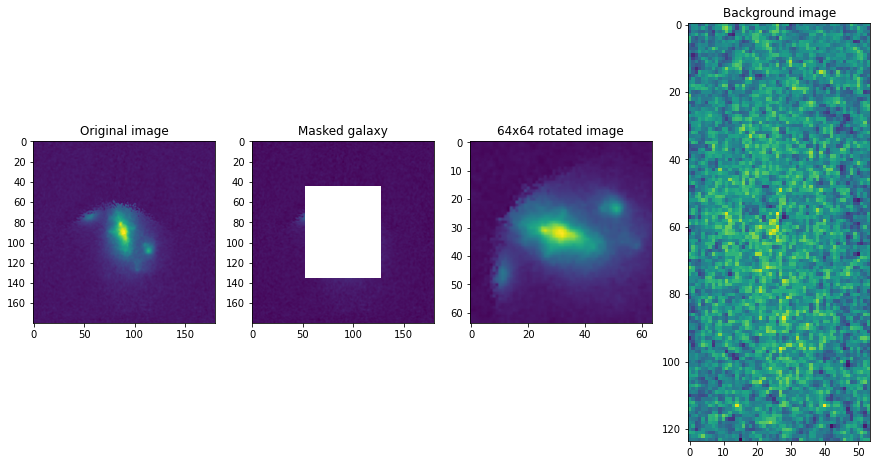

 97%|█████████▋| 97/100 [01:28<00:03,  1.05s/it]

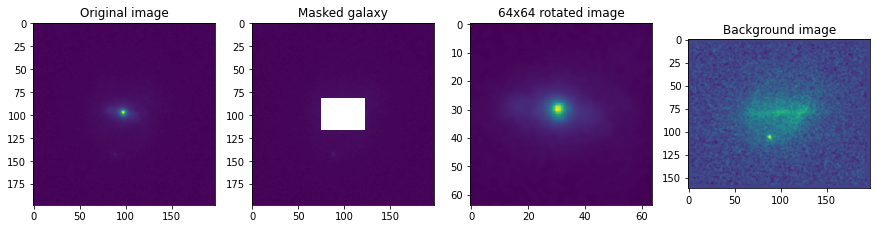

 98%|█████████▊| 98/100 [01:29<00:02,  1.22s/it]

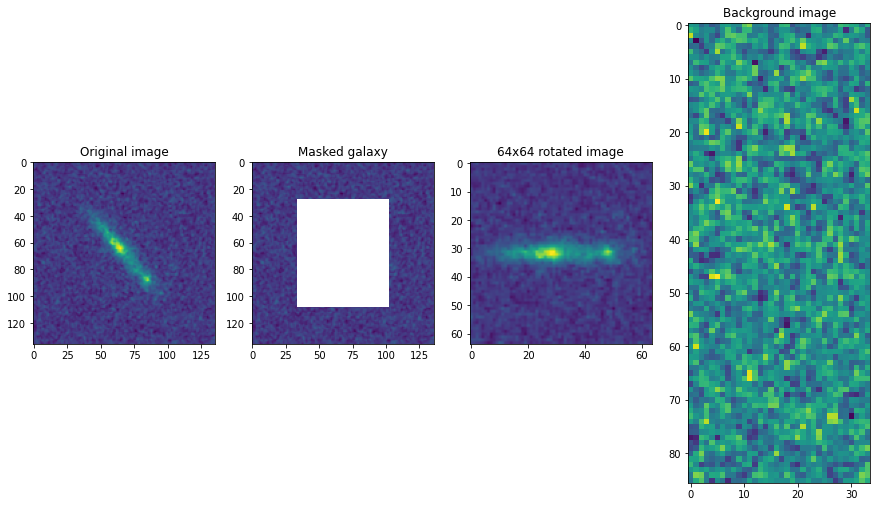

 99%|█████████▉| 99/100 [01:30<00:01,  1.16s/it]

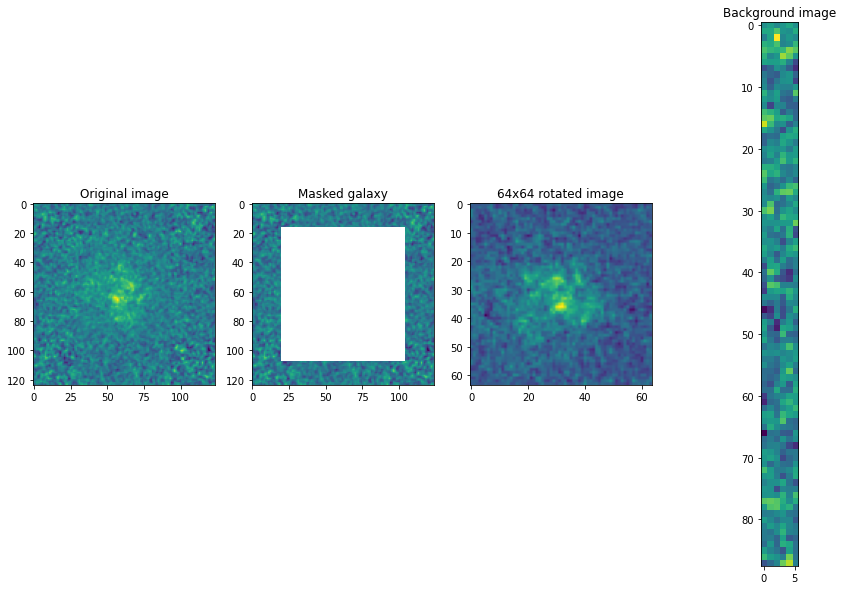

100%|██████████| 100/100 [01:31<00:00,  1.09it/s]


In [19]:
samples_number=100
sampled_indices=np.zeros(samples_number)
for i in tqdm(range(samples_number)):
    index=int(np.random.choice(np.linspace(0,cat.nobjects-1,cat.nobjects)))
    sampled_indices[i]=index
    
    _=overview_galaxy_creation(index,0.05)